### This notebook presents a systematic summary of the current (and unexpected) debugging status of axionCAMB.

The notebook will unfurl as follows:

1. A description of what exactly changes in the debugging process;
2. A description of the subprocess implementation in the code such that we can easily call it over a range of parameters of interest, vary the range of parameters as needed, and significantly reduce human error in the repeated modification of ``params.ini``;
3. A plot series comparing the axion transfer function $T_\text{ax}$ output under a range of axion masses and axion energy density fractions before and after the debugging process;
4. Repeat 3 for $Cl$s;
5. Repeat 3 for $P(k)$s. 
6. Implement 3 again for only the debugging that is expected to change the results at leading order (i.e. the background KG bug). Due to the large number of plots, and that it is observed that 4 and 5 show the effects of the bug at the same order-of-magnitude, 4 and 5 are omitted but can be obtained by request.
7. I have a set of runs of the un-debugged $\texttt{axionCAMB}$ by hand-varying the axion mass. I test that it is the same as what's been implemented here under the same parameter values and put this test in this last section, to make sure I didn't mess up the parameter assignment by implementing the subprocess procedure.

<br>

"Yet if there really is a complete unified theory, it would also presumably determine our actions. And so the theory itself would determine the outcome of our search for it! And why should it determine that we come to the right conclusions from the evidence? Might it not equally well determine that we draw the wrong conclusion? Or no conclusion at all?
"

<br>

------what I thought I had came up myself a few months ago but just found out the exact same question was asked and an at least reasonable attempted answer was made in *A Brief History of Time* which everyone claims to have read in middle school. 

<br>

Keep amazed and aware of my blindspots.

#### This notebook is entirely about axionCAMB and does not involve the implementation of improvement (KG in pert, analytical initial conditions, etc.). 

I am making the places of change as clearly as possible such that it should be reproduceable by anyone with a newly re-cloned ``axionCAMB``, so that people can double check for any possible mishaps that arise from missing procedures on my part.

<br>

<br>

<br>

### Scn. 1. Debug description

#### 1.1. Background KG $h$ normalization bug

Likely corresponds to a $\mathcal{O}(1)$ error. First reported by astralsight5 in https://github.com/dgrin1/axionCAMB/issues/6.

**1.** In ``axion_background.f90``: change the lines under the comment "``Solving Equation described and defined in top part of this fortran file``" from 

```
dvt_da(1)=v(2)/(a*(lhr))
dvt_da(2)=-2.0d0*v(2)/(a)-(maxion_twiddle**2.0d0)*a&
      *v(1)/(lhr)
```

to

```
dvt_da(1)=v(2)*dsqrt(hsq)/(a*(lhr))
dvt_da(2)=-2.0d0*v(2)/(a)-(maxion_twiddle**2.0d0)*a&
      *v(1)*dsqrt(hsq)/(lhr)
```

then, in the block after "``calculate axion adiabatic sound speed Pdot/rhodot, asymptoting to constant (physical) value at low a, when small machine numbers start to behave badly``", change

```
Params%cs2_table(i)=1.0d0+2.0d0*((maxion_twiddle*a_arr(i))**2.0d0)*v_vec(1,i)/(3.0d0*v_vec(2,i)*littlehfunc(i))
```

to

```
Params%cs2_table(i)=1.0d0+2.0d0*((maxion_twiddle*a_arr(i))**2.0d0)*v_vec(1,i)*dsqrt(hsq)/(3.0d0*v_vec(2,i)*littlehfunc(i))
```

#### 1.2. Background $\mathcal{H}$ bug

Likely corresponds to a $\mathcal{O}(10^{-2})$ error. From a mistreatment of massive neutrinos when trying to reproduce the Hubble expansion history that matches what's in the original CAMB separately in ``axion_background.f90``.

The following fix code piece is from DG

**1.** In ``inidriver_axion.f90``, before the line ``grhog= ((kappa/(c**2.0d0)*4.0d0...``, add

```
if (P%Num_nu_massive > 0) then
    if (P%Nu_mass_eigenstates==0) stop 'Have Num_nu_massive>0 but no nu_mass_eigenstates'
    if (P%Nu_mass_eigenstates==1 .and. P%Nu_mass_numbers(1)==0) P%Nu_mass_numbers(1) = P%Num_Nu_Massive
    if (all(P%Nu_mass_numbers(1:P%Nu_mass_eigenstates)==0)) P%Nu_mass_numbers=1 !just assume one for all
    if (P%share_delta_neff) then
        !default case of equal heating of all neutrinos
        fractional_number = P%Num_Nu_massless + P%Num_Nu_massive
        actual_massless = int(P%Num_Nu_massless + 1e-6_dl)
        neff_i = fractional_number/(actual_massless + P%Num_Nu_massive)
        nu_massless_degeneracy = neff_i*actual_massless
        P%Nu_massless_degeneracy=nu_massless_degeneracy
        P%Nu_mass_degeneracies(1:P%Nu_mass_eigenstates) = P%Nu_mass_numbers(1:P%Nu_mass_eigenstates)*neff_i
    end if
    if (abs(sum(P%Nu_mass_fractions(1:P%Nu_mass_eigenstates))-1) > 1e-4) &
    stop 'Nu_mass_fractions do not add up to 1'
else
    P%Nu_mass_eigenstates = 0
end if
```

**2.** In ``modules.f90``, in ``type CAMBparams``, add in appropriate places (I used under ``real(dl)  :: Nu_mass_degeneracies(max_nu)``)

```
real(dl) :: Nu_massless_degeneracy
```

in ``subroutine CAMBParams_Set(P, error, DoReion)``, right before the line ``if (CP%Num_nu_massive > 0) then``, add

```
CP%Nu_massless_degeneracy=nu_massless_degeneracy
```

**3.** In ``axion_background.f90``, change the line

```
lhsqcont_massless=(Params%Num_Nu_massless*grhor*(c**2.0d0)/((1.d5**2.0d0)))/3.0d0
```

to

```
lhsqcont_massless=(Params%nu_massless_degeneracy*grhor*(c**2.0d0)/((1.d5**2.0d0)))/3.0d0
```

#### 1.3. $\texttt{T_CMB}$ bug

Likely corresponds to a $\mathcal{O}(10^{-3})$ error (? not too sure) depending on the input value of CMB temperature in ``params.ini``. From the scattered use of the COBE CMB temperature in the code (2.7255K) instead of the input CMB temperature value. Hence if the input CMB value is the same as COBE there's no inconsitency, otherwise there is.

DG found the inconsistency but RL attempted her own fix and tested it by checking that the ``adotoa`` as fixed above in 1.2 is still consistent under a difference input CMB temperature (2.7K). The fix is primarily searching for all remaining occurrences of ``COBE`` to whatever expression corresponding to ``CP%T_CMB``.

**1.** In ``inidriver_axion.f90``: under "``Compute  some basic constants``". change

```
omegah2_rad=((COBE_CMBTemp**4.0d0)/(rhocrit))/(c**2.0d0)
```

to

```
omegah2_rad=((P%tcmb**4.0d0)/(rhocrit))/(c**2.0d0)
```

And before "``RH added this here because we are calculating omegav - but not trying to change anything globally``", change 

```
grhog= ((kappa/(c**2.0d0)*4.0d0*sigma_boltz)/(c**3.0d0))*(COBE_CMBTemp**4.0d0)*(Mpc**2.0d0) 
```

to

```
grhog= ((kappa/(c**2.0d0)*4.0d0*sigma_boltz)/(c**3.0d0))*(P%tcmb**4.0d0)*(Mpc**2.0d0) 
```

**2.** In ``axion_background.f90``, under "``Initialize massive and massless neutrino variables``", change

```
grhog = ((kappa/(c**2.0d0)*4.0d0*sigma_boltz)/(c**3.0d0))*(COBE_CMBTemp**4.0d0)*(Mpc**2.0d0) 
```

to

```
grhog = ((kappa/(c**2.0d0)*4.0d0*sigma_boltz)/(c**3.0d0))*(Params%TCMB**4.0d0)*(Mpc**2.0d0)
```

under "``calculate critical density``", change

```
Params%omegah2_rad=((COBE_CMBTemp**4.0d0)/(rhocrit))/(c**2.0d0)
```

to

```
Params%omegah2_rad=((Params%TCMB**4.0d0)/(rhocrit))/(c**2.0d0)
```

**3.** In ``equations_ppf.f90``, in ``function GetOmegak()``, change

```
omegah2_rad=((COBE_CMBTemp**4.0d0)/(rhocrit))/(c**2.0d0)
```

to

```
omegah2_rad=((CP%TCMB**4.0d0)/(rhocrit))/(c**2.0d0)
```

#### 1.4. $\texttt{svec}$ bug

Likely corresponds to a $\mathcal{O}(10^{-4})$ error. One of the matrix entries in the RK78 routine in ``axion_background.f90`` was erroneously entered.

In ``axion_background.f90``, change

```
svec(15)=0.3082649547580d-1
```

to 

```
svec(15)=0.3072649547580d-1
```

#### 1.5. Starting after $\texttt{a_osc}$ problem **(Did not implement here)**

It was observed that for some higher axion mass cases, the start time for perturbation calculation was after the defined time of start of oscillation. In my implementaion of an improved version ``auxiCAMB``, this is solved by adding a contraint of ``tau_osc`` (which was not computed in ``axionCAMB``) in the ``GetTauStart`` subroutine in ``cmbmain.f90``. 

<br>

For ``axionCAMB`` per se, this can be addressed more or less with adding a coefficient in front of one of the taustart constraints - the constraint that ``taustart <= 0.001/q``, i.e. we should start before our particular mode of interest enters the horizon. In ``cmbmain.f90``, ``function GetTauStart(q)``, we can change the last line ``taustart=min(taustart,tauosc,taueq)`` to ``taustart=min(0.001_dl*taustart,tauosc,taueq)``.

<br>

This is not implemented here since we would like to focus on the bugfix that are actually erroneous, like the aforementioned 4 items. We would also like to first pay attention to the mass ranges that have ``a_osc ~ a_eq``, where the perceived problems should be the most prominent.

<br>

#### <font text color = #2082b0> Note in particular for this set of tests

<font text color = #2082b0> Since the initial k-sampling (when $\texttt{get_scalar_cls = F}$, not subsequently modified by optimization considering the CMB when $\texttt{get_scalar_cls = T}$) features a minimum $k$ value $\texttt{qmin}$, which depends on the present-day conformal time $\texttt{tau0}$, which then changes over the modification. In order to enable plotting of fractional differences between transfer functions I have temporarily tweaked the block of code in $\texttt{subroutine InitTransfer}$ in $\texttt{cmbmain.f90}$ so that it starts with a fixed minimum $k$ value. (The "oscillatory" feature of the transfer function in $k$ space makes interpolation difficult and unreliable.)</font>

<br>

<font text color = #2082b0>**This should not end up in the final version of the code.** On the other hand, when $\texttt{get_scalar_cls = T}$, the optimization process is also expected to change over the debugging process. Modifying that part might tamper with the code too much, and since the $l$s for $C_l$s always remain the same, I chose not to do so and only plot the fractional difference between transfer functions under $\texttt{get_scalar_cls = F}$. </font>

<br>

<font text color = #2082b0>This might leave the worry that I might need to check whether the values of my transfer function output under $\texttt{get_scalar_cls = F}$ matches that under $\texttt{get_scalar_cls = T}$, only with a different sampling of $k$ which is by all means required for the code. **I did not test that here in this notebook, which is again a little tricky, but could continue to do that if found necessary.</font>**

<font text color = #2082b0>The particular block of code I tweaked **(for both the modified and the unmodified code)**:</font> in ``cmbmain.f90``, in the subroutine ``InitTransfer``, under ``!Fixed spacing``, change

```
MT%num_q_trans=int((log(CP%Transfer%kmax)-log(qmin))*CP%Transfer%k_per_logint)+1 !Original
allocate(q_transfer(MT%num_q_trans))
do q_ix=1, MT%num_q_trans
    q_transfer(q_ix) = qmin*exp(real(q_ix)/CP%Transfer%k_per_logint) !Original
end do
```

to

```
MT%num_q_trans=int((log(CP%Transfer%kmax)-log(1.e-6))*CP%Transfer%k_per_logint)+1 
allocate(q_transfer(MT%num_q_trans))
do q_ix=1, MT%num_q_trans
    q_transfer(q_ix) = 1.e-6*exp(real(q_ix)/CP%Transfer%k_per_logint)
end do
```

i.e. essentially replacing ``qmin`` with a sufficiently small number ``1.e-6`` (two places).

<br>

<br>

<br>


### Scn. 2. $\texttt{subprocess}$ implementation

I currently have two local copies of ``axionCAMB``, one without any fixes and the other with the above fixes. The following cells run the comparison between the two versions, although independent reproducing the results and cross-checking is very appreciated.

#### Since a relatively large number of modifications to ``params.ini`` and running are happening, we can make our lives easier by calling via $\texttt{subprocess}$ in Python. This way, we can tweak the parameters easily and run through a for-loop.

The step-by-step instruction is as follows: (inspired by the document David provided)

**1.** Identify the parameters we'd like to change in ``params.ini``:

 - ``get_scalar_cls`` - we want it ``T`` when outputting the $Cl$s, but due to some peculiarities of the internal CAMB structure, when it's set to ``F``, we obtain a more densely-sampled $k$ for transfer function output (i.e. it follows the user-specified $k$ sampling. When ``T``, there are CAMB internal restrictions applied to the $k$ sampling.)
 
 - ``l_max_scalar`` - I set it to 5000 while the default was 2500. Usually 5000 should be enough to show all the damping tails of $C_l$, but it's good to keep it flexible.
 
 - Note that we will be using axion energy density fraction so we use ``use_axfrac = T`` in the code. To make sure we don't mess up we can also comment out ``omaxh2``. This will not change in our calls.
  
 - ``m_ax`` - mass of axions.
  
 - ``axfrac`` - fraction of axions as dark matter.
  
 - ``transfer_kmax`` - the maximum $k$ in the transfer function. We may need to tweak that to show the transfer function features for different axion masses.
  
 - ``transfer_k_per_logint`` - controls the user-specified $k$-sampling density.
  
  This run doesn't involve changing ``accuracyboost``, but it may be added for relevant purposes later.
  
  We have a total of 6 inputs to specify in the code.

**2.** In ``inidriver_axion.F90``, change line 34 (immediately after ``LensedTotFileName, LensPotentialFileName,ScalarCovFileName`` from

```
integer i
```

to

```
integer i, int1, int2, int3, int4, int5, int6
```

; **then,** at line 40 (right after ``!real clock_start, clock_stop``), insert

```
character(LEN=1) buffer1, buffer3, buffer5, buffer7, buffer9, buffer11
character(LEN=23) buffer2, buffer4, buffer6, buffer8, buffer10, buffer12
logical get_scalar_cls
integer l_max_scalar, transfer_k_per_logint
real(dl) transfer_kmax, m_ax, axfrac
```

; **then,** right after "``End axion stuff``", insert

```
call getarg(2,buffer1)
read(buffer1,*) int1
call getarg(3,buffer2)
read(buffer2,*) get_scalar_cls

call getarg(4,buffer3)
read(buffer3,*) int2
call getarg(5,buffer4)
read(buffer4,*) l_max_scalar

call getarg(6,buffer5)
read(buffer5,*) int3
call getarg(7,buffer6)
read(buffer6,*) transfer_k_per_logint

call getarg(8,buffer7)
read(buffer7,*) int4
call getarg(9,buffer8)
read(buffer8,*) transfer_kmax

call getarg(10,buffer9)
read(buffer9,*) int5
call getarg(11,buffer10)
read(buffer10,*) m_ax

call getarg(12,buffer11)
read(buffer11,*) int6
call getarg(13,buffer12)
read(buffer12,*) axfrac
```

Till now we're telling ``axionCAMB`` to expect additional arguments to be fed to it when it is called from the command line. **This also sets up the order at which the parameters are passed on:**

``get_scalar_cls, l_max_scalar, transfer_k_per_logint, transfer_kmax, m_ax, axfrac``

**3.** Now we're feeing the input into the code in its respective places.

Right after ``P%WantScalars = Ini_Read_Logical('get_scalar_cls')``, insert

```
if (int1.eq.1) then
   P%WantScalars = get_scalar_cls
end if
```

Right after ``P%Max_l = Ini_Read_Int('l_max_scalar')``, insert

```
if (int2.eq.2) then
  P%Max_l = l_max_scalar
end if
```

Right after ``P%transfer%k_per_logint  =  Ini_Read_Int('transfer_k_per_logint')``, add

```
if (int3.eq.3) then
   P%transfer%k_per_logint = transfer_k_per_logint
end if
```

Right after ``P%transfer%kmax          =  Ini_Read_Double('transfer_kmax')``, add

```
if (int4.eq.4) then
    P%transfer%kmax =  transfer_kmax
end if
```

Right after `` P%ma     = Ini_Read_Double('m_ax')`` (**note there are two identical lines like this, and we'll need to do that for each line)**, add

```
if (int5.eq.5) then
    P%ma = m_ax
end if
```

Right after ``P%axfrac = Ini_Read_Double('axfrac')``, add

```
if (int6.eq.6) then
    P%axfrac = axfrac
end if
```

**4.** Recompile. ``make clean`` and ``make``.

**5.** Run via

``./camb params.ini 1 # 2 # 3 # 4 # 5 # 6 #``

in the same order as specified above:

``1 get_scalar_cls 2 l_max_scalar 3 transfer_k_per_logint 4 transfer_kmax 5 m_ax 6 axfrac``

Repeat the practice above for the debugged ``axionCAMB``. **Before doing that, it is an option to make a copy of the debugged ``axionCAMB`` so that we have one without the subprocess implementation. Make sure all the other parameters in  ``params.ini`` are the same for the two versions.**

#### After all that hassle we can produce the batch of data to generate plots hassle-free, and we can change the desired range of parameters easily.

<br>

<br>

<br>


### Scn.s 3 - 5 pre-processing: data generation

In [1]:
#Modules to import
import os
import subprocess
import numpy as np
from scipy import interpolate, integrate
import natpy as nat
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'svg' #This backend works magically clear plots
#%config InlineBackend.figure_format = 'png' #But to show on github I need to use png - 
                                            #or keep svg and use the publicnbconverter
#For \text command
plt.rcParams['text.usetex'] = True
plt.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'
plt.rcParams['figure.dpi']= 72.0 #For svg
#plt.rcParams['figure.dpi']= 216.0 #For svg
plt.rcParams['lines.linewidth'] = 2.3
plt.rcParams["mathtext.fontset"] = "cm"
plt.rcParams["font.family"] = "cmr10"
plt.rcParams["font.size"] = 16
plt.rcParams["axes.xmargin"] = 0
plt.rcParams['axes.axisbelow'] = True
plt.rcParams['axes.facecolor'] = (1,1,1,0) #For transparent plot background
plt.rcParams["grid.color"] = "#dddddd"
#from IPython.core.interactiveshell import InteractiveShell
#InteractiveShell.ast_node_interactivity = "none"

### Before plotting, let's generate all the data we need, so that we can save some time not running the whole thing again if it's just the plot itself that needs some adjusting.

In this notebook, I take the mass ranges: 1e-26, 28, 30, 32eV; $f_\text{ax}$ ranges: 1e-3, 1e-1, 0.5, 1.0; ``get_scalar_cls`` being T, F (F is for generating the transfer function with a denser (user-specified) k-sampling. Due to CAMB's internal structure, this is suppressed (i.e. we get a sparser $k$ sampling than we input) under ``get_scalar_cls`` being T.

<br>

This choice is motivated by that we would like to see the impacts of the bug, which are most observable for masses with ``a_osc ~ a_eq``, when the axion fraction as a function of time starts to become non-negligible as we leave radiation-domination, and the axion perturbations exhibit the most oscillatory behavior.

<br>

<br>

**Each cell below (2 ``get_scalar_cls``, 4 axion masses, 4 axion fractions - 32 runs altogether for one particular code) takes about 5-6min to run. The time will be longer if we choose higher mass axions which need to go to higher $k$ modes to display any oscillatory behavior in the transfer function. Low mass axions take significantly shorter time.**

#### <font text color = #2082b0> Remember to complie by $\texttt{make clean}$ and $\texttt{make}$ before running the subprocess cells below.

#### Undebugged axionCAMB

In [2]:
#IF YOU HAVE THE NEED TO CHANGE DIRECTORY, DO IT BEFORE CALLING SUBPROCESS
os.chdir('/Users/ra_yne/research/axionEFA/axionCAMB_nochangesintended')

#Dimensionless hubble from the params.ini file
h = 67.31/100.00

#Pre-set the parameters I might not need to modify for this cell - mind the order
l_max_scalar = 5000 
transfer_k_per_logint = 100 


#THE FOLLOWING ARE THE RANGES OF VARIABLES THAT ARE ACTUALLY VARYING. 
#We can make a smaller list to check if it works first
get_scalar_cls_list = ['T', 'F']# #use string here to put in the call command
m_ax_list = ['1.e-26', '1.e-28', '1.e-30', '1.e-32']#use string here to put in the call command 
m_ax_label_list = [m_axitem.replace('.', '') for m_axitem in m_ax_list] #To put in filenames
axfrac_list = ['1.e-3', '0.1', '0.5', '1.0'] #use string here to put in the call command 
                                            # (or else python would set it to zero)
axfrac_label_list_temp = [axfrac_item.replace('.e', 'e') for axfrac_item in axfrac_list] 
axfrac_label_list = [axfrac_item.replace('.', 'd') for axfrac_item in axfrac_label_list_temp] #To put in filenames
#print(axfrac_label_list)
#Range of maximum k corresponding to the respoective axion masses,
#(for purposes of showing the best range of the transfer function)
#NOTE THAT THE INPUT K IN CAMB IS ACTUALLY KH. To obtain our desired k in Mpc^-1, divide our
#k by h before feeding it to CAMB.
kmax_list = [3, 1, 0.3, 0.1]


#Generate data
for i in range(len(get_scalar_cls_list)):
    get_scalar_cls = get_scalar_cls_list[i]
    for j in range(len(axfrac_list)):
        axfrac = axfrac_list[j]
        axfrac_label = axfrac_label_list[j]
        for k in range(len(m_ax_list)):
            m_ax_label = m_ax_label_list[k]
            
            #Can comment out the print statement if wanted, more for confirming/progress checking purposes
            print('./camb params.ini 1 %s 2 %i 3 %i 4 %s 5 %s 6 %s'%(get_scalar_cls, l_max_scalar, \
                                               transfer_k_per_logint, str(kmax_list[k]/h), m_ax_list[k], axfrac))
            subprocess.call('./camb params.ini 1 %s 2 %i 3 %i 4 %s 5 %s 6 %s'%(get_scalar_cls, l_max_scalar, \
                                               transfer_k_per_logint, str(kmax_list[k]/h), m_ax_list[k], axfrac), shell = True)
            #print('transfer_max=%seV_axfrac=%s_getscalarcls=%s.dat'%(m_ax_label, axfrac_label, get_scalar_cls))
            #Move transfer function files
            subprocess.call('mv test_transfer_out.dat transfer_max=%seV_axfrac=%s_getscalarcls=%s.dat'\
                            %(m_ax_label, axfrac_label, get_scalar_cls), shell = True)  
            #Move matter power spectrum files
            #print('matterpower_max=%seV_axfrac=%s_getscalarcls=%s.dat'%(m_ax_label, axfrac_label, get_scalar_cls))
            subprocess.call('mv test_matterpower.dat matterpower_max=%seV_axfrac=%s_getscalarcls=%s.dat'\
                            %(m_ax_label, axfrac_label, get_scalar_cls), shell = True)
            if get_scalar_cls == 'T':
                #Move scalar_cls files
                #print('scalCls_max=%seV_axfrac=%s.dat' %(m_ax_label, axfrac_label))
                subprocess.call('mv test_scalCls.dat scalCls_max=%seV_axfrac=%s.dat'%(m_ax_label, axfrac_label), \
                                shell = True)  

./camb params.ini 1 T 2 5000 3 100 4 4.456990046055564 5 1.e-26 6 1.e-3
./camb params.ini 1 T 2 5000 3 100 4 1.4856633486851878 5 1.e-28 6 1.e-3
./camb params.ini 1 T 2 5000 3 100 4 0.44569900460555634 5 1.e-30 6 1.e-3
./camb params.ini 1 T 2 5000 3 100 4 0.1485663348685188 5 1.e-32 6 1.e-3
./camb params.ini 1 T 2 5000 3 100 4 4.456990046055564 5 1.e-26 6 0.1
./camb params.ini 1 T 2 5000 3 100 4 1.4856633486851878 5 1.e-28 6 0.1
./camb params.ini 1 T 2 5000 3 100 4 0.44569900460555634 5 1.e-30 6 0.1
./camb params.ini 1 T 2 5000 3 100 4 0.1485663348685188 5 1.e-32 6 0.1
./camb params.ini 1 T 2 5000 3 100 4 4.456990046055564 5 1.e-26 6 0.5
./camb params.ini 1 T 2 5000 3 100 4 1.4856633486851878 5 1.e-28 6 0.5
./camb params.ini 1 T 2 5000 3 100 4 0.44569900460555634 5 1.e-30 6 0.5
./camb params.ini 1 T 2 5000 3 100 4 0.1485663348685188 5 1.e-32 6 0.5
./camb params.ini 1 T 2 5000 3 100 4 4.456990046055564 5 1.e-26 6 1.0
./camb params.ini 1 T 2 5000 3 100 4 1.4856633486851878 5 1.e-28 6 1.0

#### I have a set of runs of the un-debugged axionCAMB by hand-varying the axion mass in $\texttt{params.ini}$, under $f_\text{ax} = 1.0$. In the very last section I will test that it is the same as what's been implemented here under the same parameter values.

#### axionCAMB after debugging

Same block of code, just change the directory, and (optional) change the output file name.

Also **remember to set ``axionCAMB`` to running mode if you happen to be using one in debug mode, or you won't have output files!**

In [2]:
#IF YOU HAVE THE NEED TO CHANGE DIRECTORY, DO IT BEFORE CALLING SUBPROCESS
os.chdir(\
    '/Users/ra_yne/research/axionEFA/axionCAMB_recloned_fixedbackgroundderivs_fixedmassiveneutrinos_fixedsvec_fixedTCMB')

#Dimensionless hubble from the params.ini file
h = 67.31/100.00

#Pre-set the parameters I might not need to modify for this cell - mind the order
l_max_scalar = 5000 
transfer_k_per_logint = 100 


#THE FOLLOWING ARE THE RANGES OF VARIABLES THAT ARE ACTUALLY VARYING. 
#We can make a smaller list to check if it works first
get_scalar_cls_list = ['T', 'F']# #use string here to put in the call command
m_ax_list = ['1.e-26', '1.e-28', '1.e-30', '1.e-32']#use string here to put in the call command 
m_ax_label_list = [m_axitem.replace('.', '') for m_axitem in m_ax_list] #To put in filenames
axfrac_list = ['1.e-3', '0.1', '0.5', '1.0'] #use string here to put in the call command 
                                            # (or else python would set it to zero)
axfrac_label_list_temp = [axfrac_item.replace('.e', 'e') for axfrac_item in axfrac_list] 
axfrac_label_list = [axfrac_item.replace('.', 'd') for axfrac_item in axfrac_label_list_temp] #To put in filenames
#print(axfrac_label_list)
#Range of maximum k corresponding to the respoective axion masses,
#(for purposes of showing the best range of the transfer function)
#NOTE THAT THE INPUT K IN CAMB IS ACTUALLY KH. To obtain our desired k in Mpc^-1, divide our
#k by h before feeding it to CAMB.
kmax_list = [3, 1, 0.3, 0.1]

#Generate data
for i in range(len(get_scalar_cls_list)):
    get_scalar_cls = get_scalar_cls_list[i]
    for j in range(len(axfrac_list)):
        axfrac = axfrac_list[j]
        axfrac_label = axfrac_label_list[j]
        for k in range(len(m_ax_list)):
            m_ax_label = m_ax_label_list[k]
            print('./camb params.ini 1 %s 2 %i 3 %i 4 %s 5 %s 6 %s'%(get_scalar_cls, l_max_scalar, \
                                               transfer_k_per_logint, str(kmax_list[k]/h), m_ax_list[k], axfrac))
            subprocess.call('./camb params.ini 1 %s 2 %i 3 %i 4 %s 5 %s 6 %s'%(get_scalar_cls, l_max_scalar, \
                                               transfer_k_per_logint, str(kmax_list[k]/h), m_ax_list[k], axfrac), shell = True)
            #Can comment out the print statement if wanted, more for confirming/progress checking purposes
            #print('postdebug_transfer_max=%seV_axfrac=%s_getscalarcls=%s.dat'\
            #                %(m_ax_label, axfrac_label, get_scalar_cls))
            #Move transfer function files
            subprocess.call('mv test_transfer_out.dat postdebug_transfer_max=%seV_axfrac=%s_getscalarcls=%s.dat'\
                            %(m_ax_label, axfrac_label, get_scalar_cls), shell = True)  
            #Move matter power spectrum files
            #print('postdebug_matterpower_max=%seV_axfrac=%s_getscalarcls=%s.dat'\
            #                %(m_ax_label, axfrac_label, get_scalar_cls))
            subprocess.call('mv test_matterpower.dat postdebug_matterpower_max=%seV_axfrac=%s_getscalarcls=%s.dat'\
                            %(m_ax_label, axfrac_label, get_scalar_cls), shell = True)
            if get_scalar_cls == 'T':
                #Move scalar_cls files
                #print('postdebug_scalCls_max=%seV_axfrac=%s.dat' %(m_ax_label, axfrac_label))
                subprocess.call('mv test_scalCls.dat postdebug_scalCls_max=%seV_axfrac=%s.dat'\
                                %(m_ax_label, axfrac_label), shell = True)  

./camb params.ini 1 T 2 5000 3 100 4 4.456990046055564 5 1.e-26 6 1.e-3
./camb params.ini 1 T 2 5000 3 100 4 1.4856633486851878 5 1.e-28 6 1.e-3
./camb params.ini 1 T 2 5000 3 100 4 0.44569900460555634 5 1.e-30 6 1.e-3
./camb params.ini 1 T 2 5000 3 100 4 0.1485663348685188 5 1.e-32 6 1.e-3
./camb params.ini 1 T 2 5000 3 100 4 4.456990046055564 5 1.e-26 6 0.1
./camb params.ini 1 T 2 5000 3 100 4 1.4856633486851878 5 1.e-28 6 0.1
./camb params.ini 1 T 2 5000 3 100 4 0.44569900460555634 5 1.e-30 6 0.1
./camb params.ini 1 T 2 5000 3 100 4 0.1485663348685188 5 1.e-32 6 0.1
./camb params.ini 1 T 2 5000 3 100 4 4.456990046055564 5 1.e-26 6 0.5
./camb params.ini 1 T 2 5000 3 100 4 1.4856633486851878 5 1.e-28 6 0.5
./camb params.ini 1 T 2 5000 3 100 4 0.44569900460555634 5 1.e-30 6 0.5
./camb params.ini 1 T 2 5000 3 100 4 0.1485663348685188 5 1.e-32 6 0.5
./camb params.ini 1 T 2 5000 3 100 4 4.456990046055564 5 1.e-26 6 1.0
./camb params.ini 1 T 2 5000 3 100 4 1.4856633486851878 5 1.e-28 6 1.0

<br>

<br>

<br>


### Scn. 3. $T_\text{ax}$

With all the data generated, we can now compare the outputs from the original and the debugged ``axionCAMB``. This section addresses the axion transfer function at $z = 0$ across the sampled axion masses and energy density fraction in DM.

In all the figures below, the upper panel plots the results from the original ``axionCAMB`` (solid, orange color series) and the debugged ``axionCAMB`` (dashed, blue color series); the lower panel plots their fractional difference.

#### The following cell is generated under $\texttt{get_scalar_cls = F}$, which gives a more densely-sampled (presumably desired) $k$ space for the transfer function.

True
True
True
True


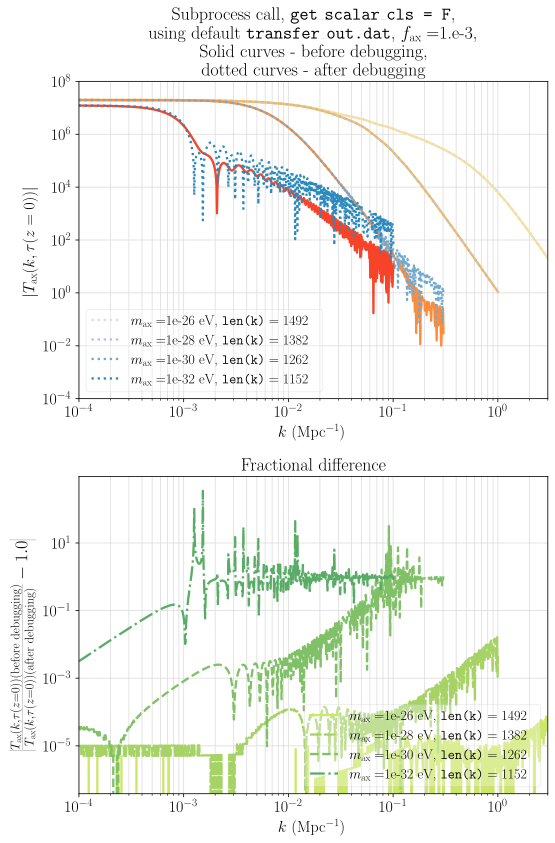

True
True
True
True


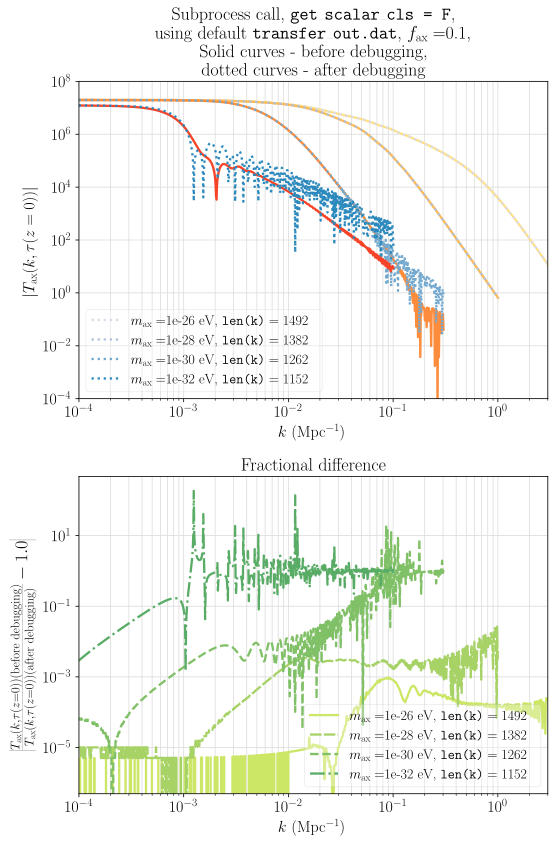

True
True
True
True


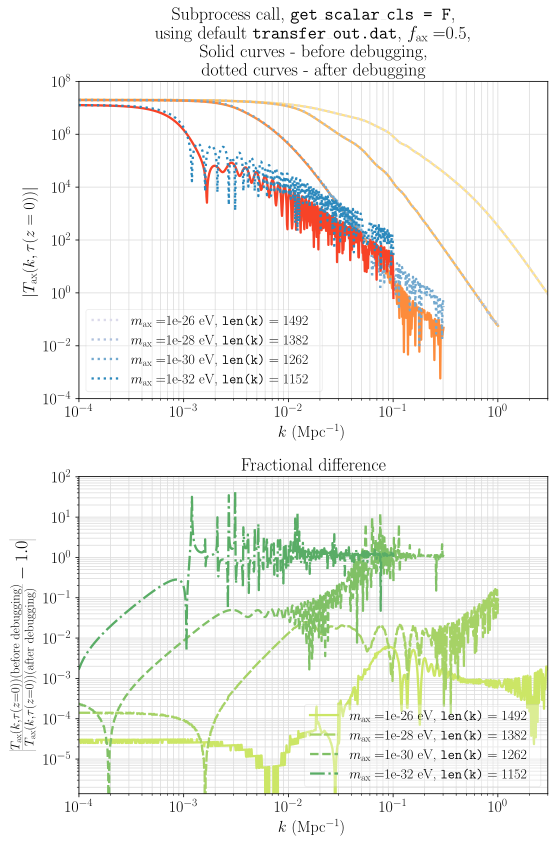

True
True
True
True


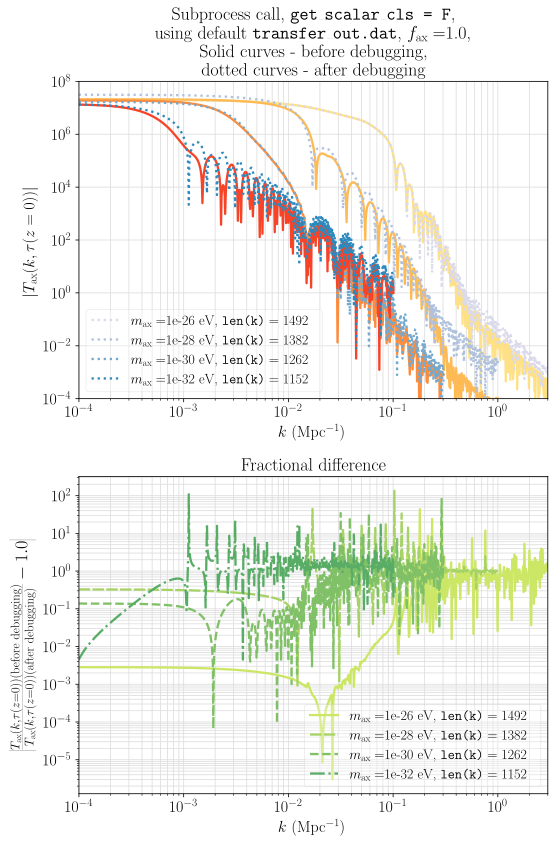

In [5]:
#Dimensionless hubble from the params.ini file
h = 67.31/100.00
get_scalar_cls_list = ['T', 'F']# #use string here to put in the call command
m_ax_list = ['1.e-26', '1.e-28', '1.e-30', '1.e-32']#use string here to put in the call command 
m_ax_label_list = [m_axitem.replace('.', '') for m_axitem in m_ax_list] #To put in filenames
axfrac_list = ['1.e-3', '0.1', '0.5', '1.0'] #use string here to put in the call command 
                                            # (or else python would set it to zero)
axfrac_label_list_temp = [axfrac_item.replace('.e', 'e') for axfrac_item in axfrac_list] 
axfrac_label_list = [axfrac_item.replace('.', 'd') for axfrac_item in axfrac_label_list_temp] #To put in filenames
#Range of maximum k corresponding to the respoective axion masses,
#(for purposes of showing the best range of the transfer function)
kmax_list = [3, 1, 0.3, 0.1] 

#Define colormap and linestyle
colorsax0 = plt.cm.YlOrRd(np.linspace(0.2, 0.8, len(m_ax_label_list) + 1))
colorsax1 = plt.cm.PuBu(np.linspace(0.2, 0.8, len(m_ax_label_list) + 1))
colorscdm = plt.cm.bone(np.linspace(0.4, 0.8, len(m_ax_label_list) + 1))
colorsdiff = plt.cm.summer(np.linspace(0.8, 0.2, len(m_ax_label_list) + 1))
linescdm = ['solid', (0, (5, 1)), 'dashed', 'dashdot', (0, (3, 5, 1, 5, 1, 5)), 'dotted', (0, (5, 10))]

#Preset False
get_scalar_cls = 'F'

#Loop over the axion fraction
for i in range(len(axfrac_list)):
    axfrac = axfrac_list[i]
    axfrac_label = axfrac_label_list[i]
    fig, axs = plt.subplots(2, figsize = (8, 12))
    for j in range(len(m_ax_list)):
        m_ax_label = m_ax_label_list[j]
        #Transfer function before debugging
        os.chdir('/Users/ra_yne/research/axionEFA/axionCAMB_nochangesintended')
        Transfer_kh_before, Transfer_cdm_before,Transfer_b_before,Transfer_g_before, Transfer_r_before, \
        Transfer_nu_before, Transfer_axion_before, Transfer_after_before, Transfer_tot_before = \
        np.loadtxt('transfer_max=%seV_axfrac=%s_getscalarcls=%s.dat'\
                            %(m_ax_label, axfrac_label, get_scalar_cls), unpack = True)
        #Transfer function after debugging
        os.chdir(\
    '/Users/ra_yne/research/axionEFA/axionCAMB_recloned_fixedbackgroundderivs_fixedmassiveneutrinos_fixedsvec_fixedTCMB')
        Transfer_kh_after, Transfer_cdm_after,Transfer_b_after,Transfer_g_after, Transfer_r_after, Transfer_nu_after, \
        Transfer_axion_after, Transfer_after_after, Transfer_tot_after = \
        np.loadtxt('postdebug_transfer_max=%seV_axfrac=%s_getscalarcls=%s.dat'\
                           %(m_ax_label, axfrac_label, get_scalar_cls), unpack = True)
        #Check that I have imposed the same ks
        print(np.all(Transfer_kh_before==Transfer_kh_after)) 
        
        axs[0].plot(Transfer_kh_before*h, abs(Transfer_axion_before), color = colorsax0[j])
        axs[0].plot(Transfer_kh_after*h , abs(Transfer_axion_after), color = colorsax1[j], linestyle = 'dotted', \
                    label = r'$m_\text{ax} = $%s eV, '%m_ax_label + r'$\texttt{len(k)} = %i$'%len(Transfer_kh_after))
        axs[1].plot(Transfer_kh_after*h , abs(Transfer_axion_before/Transfer_axion_after - 1.), color = colorsdiff[j], \
            linestyle = linescdm[j], label = r'$m_\text{ax} = $%s eV, '\
                    %m_ax_label + r'$\texttt{len(k)} = %i$'%len(Transfer_kh_after))
       
    axs[0].legend(fontsize = 14, loc = 'lower left', fancybox=True, framealpha=0.3) 
    axs[0].set_xscale('log')
    axs[0].set_yscale('log')
    #axs.set_yscale('symlog', linthresh = 1e-33)
    axs[0].set_xlim((1e-4, 3.0))
    axs[0].set_ylim((1e-4, 1e8))
    axs[0].set_xlabel(r'$k$ (Mpc$^{-1}$)')
    axs[0].set_ylabel(r'$\left|T_\text{ax}(k, \tau(z=0))\right|$')
    axs[0].set_title(r'Subprocess call, $\texttt{get\_scalar\_cls = %s}$,'%get_scalar_cls + \
              '\n' + r'using default $\texttt{transfer\_out.dat}$, $f_\text{ax} = $%s,'%axfrac +\
                 '\n' + r'Solid curves - before debugging,' + \
                 '\n' + r'dotted curves - after debugging', fontsize = 18)  
    axs[0].grid(which = 'both')

    axs[1].legend(fontsize = 14, loc = 'lower right', fancybox=True, framealpha=0.3) 
    axs[1].set_xscale('log')
    axs[1].set_yscale('log')
    #axs.set_yscale('symlog', linthresh = 1e-33)
    axs[1].set_xlim((1e-4, 3.0))
    #axs[1].set_ylim(bottom = 3e-2)
    axs[1].set_xlabel(r'$k$ (Mpc$^{-1}$)')
    axs[1].set_ylabel(\
            r'$\left|\frac{T_\text{ax}(k, \tau(z=0))\text{(before debugging)}}' + \
                      r'{T_\text{ax}(k, \tau(z=0))\text{(after debugging)}} - 1.0\right|$', fontsize = 18)
    axs[1].set_title(r'Fractional difference', fontsize = 18) 
    axs[1].grid(which = 'both')
    plt.tight_layout()
    plt.show()

#### Note again as explained before the $k$ space sampling becomes different via CAMB's optimization under $\texttt{get_scalar_cls = T}$. We thus cannot plot the fractional differences, but can still plot the results before and after debug side-by-side. We can see the obvious sparseness in the $k$-sampling, but the conclusion of the pre/post-debug comparison should remain the same.

332
332
222
222
186
186
186
186


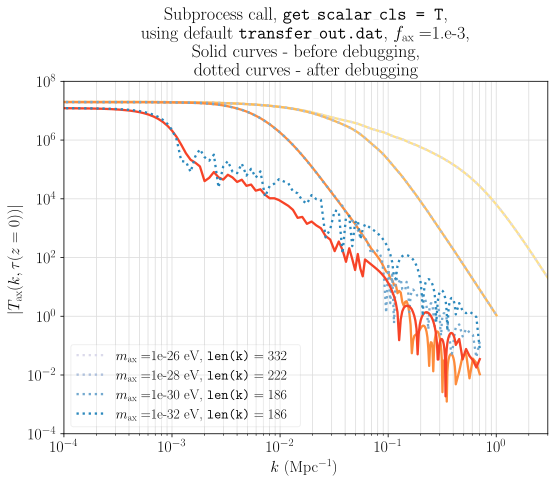

332
332
223
223
187
187
186
186


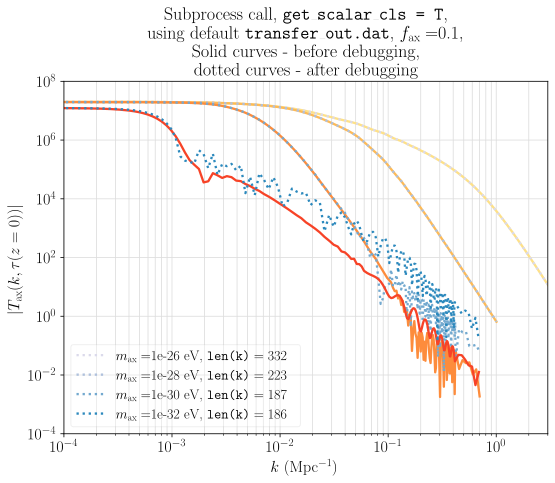

332
332
227
228
196
196
187
186


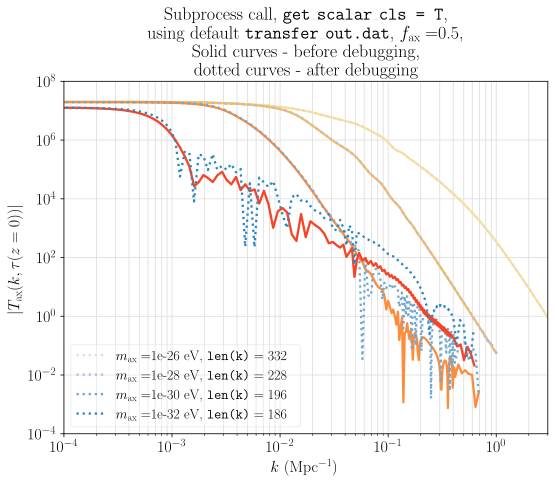

332
332
235
243
214
218
180
177


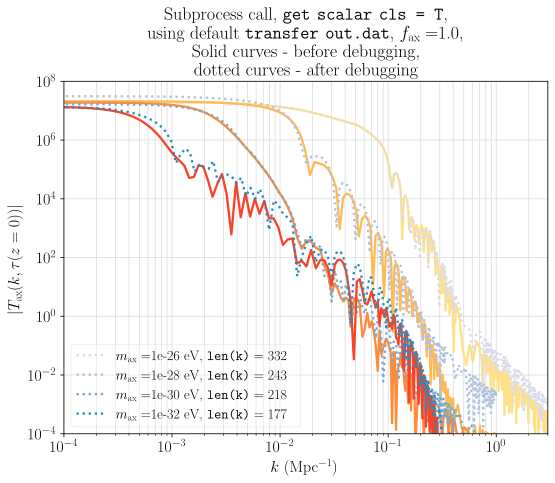

In [6]:
#Dimensionless hubble from the params.ini file
h = 67.31/100.00
get_scalar_cls_list = ['T', 'F']# #use string here to put in the call command
m_ax_list = ['1.e-26', '1.e-28', '1.e-30', '1.e-32']#use string here to put in the call command 
m_ax_label_list = [m_axitem.replace('.', '') for m_axitem in m_ax_list] #To put in filenames
axfrac_list = ['1.e-3', '0.1', '0.5', '1.0'] #use string here to put in the call command (or else python would set it to zero)
axfrac_label_list_temp = [axfrac_item.replace('.e', 'e') for axfrac_item in axfrac_list] 
axfrac_label_list = [axfrac_item.replace('.', 'd') for axfrac_item in axfrac_label_list_temp] #To put in filenames
#Range of maximum k corresponding to the respoective axion masses,
#(for purposes of showing the best range of the transfer function)
kmax_list = [3, 1, 0.3, 0.1] 

#Define colormap and linestyle
colorsax0 = plt.cm.YlOrRd(np.linspace(0.2, 0.8, len(m_ax_label_list) + 1))
colorsax1 = plt.cm.PuBu(np.linspace(0.2, 0.8, len(m_ax_label_list) + 1))
colorscdm = plt.cm.bone(np.linspace(0.4, 0.8, len(m_ax_label_list) + 1))
colorsdiff = plt.cm.summer(np.linspace(0.8, 0.2, len(m_ax_label_list) + 1))
linescdm = ['solid', (0, (5, 1)), 'dashed', 'dashdot', (0, (3, 5, 1, 5, 1, 5)), 'dotted', (0, (5, 10))]

#Preset False
get_scalar_cls = 'T'

#Loop over the axion fraction
for i in range(len(axfrac_list)):
    axfrac = axfrac_list[i]
    axfrac_label = axfrac_label_list[i]
    fig, axs = plt.subplots(1, figsize = (8, 7))
    for j in range(0, len(m_ax_list)):
        m_ax_label = m_ax_label_list[j]
        #Transfer function before debugging
        os.chdir('/Users/ra_yne/research/axionEFA/axionCAMB_nochangesintended')
        Transfer_kh_before, Transfer_cdm_before,Transfer_b_before,Transfer_g_before, Transfer_r_before, \
        Transfer_nu_before, Transfer_axion_before, Transfer_after_before, Transfer_tot_before = \
        np.loadtxt('transfer_max=%seV_axfrac=%s_getscalarcls=%s.dat'\
                            %(m_ax_label, axfrac_label, get_scalar_cls), unpack = True)
        #Transfer function after debugging
        os.chdir(\
    '/Users/ra_yne/research/axionEFA/axionCAMB_recloned_fixedbackgroundderivs_fixedmassiveneutrinos_fixedsvec_fixedTCMB')
        Transfer_kh_after, Transfer_cdm_after,Transfer_b_after,Transfer_g_after, Transfer_r_after, Transfer_nu_after, \
        Transfer_axion_after, Transfer_after_after, Transfer_tot_after = \
        np.loadtxt('postdebug_transfer_max=%seV_axfrac=%s_getscalarcls=%s.dat'\
                            %(m_ax_label, axfrac_label, get_scalar_cls), unpack = True)
        #This time I don't have the same ks
        print(len(Transfer_kh_before))
        print(len(Transfer_kh_after))
        #print(np.all(Transfer_kh_before==Transfer_kh_after)) 
        
        axs.plot(Transfer_kh_before*h, abs(Transfer_axion_before), color = colorsax0[j])
        axs.plot(Transfer_kh_after*h , abs(Transfer_axion_after), color = colorsax1[j], linestyle = 'dotted', \
                 label = r'$m_\text{ax} = $%s eV, '%m_ax_label + r'$\texttt{len(k)} = %i$'%len(Transfer_kh_after))
        #axs[1].plot(Transfer_kh_after*h , abs(Transfer_axion_before/Transfer_axion_after - 1.), \
        #color = colorsdiff[j], linestyle = linescdm[j], label = r'$m_\text{ax} = $%s eV, '\
        #%m_ax_label + r'$\texttt{len(k)} = %i$'%len(Transfer_kh_after))
       
    axs.legend(fontsize = 14, loc = 'lower left', fancybox=True, framealpha=0.3) 
    axs.set_xscale('log')
    axs.set_yscale('log')
    #axs.set_yscale('symlog', linthresh = 1e-33)
    axs.set_xlim((1e-4, 3.0))
    axs.set_ylim((1e-4, 1e8))
    axs.set_xlabel(r'$k$ (Mpc$^{-1}$)')
    axs.set_ylabel(r'$\left|T_\text{ax}(k, \tau(z=0))\right|$')
    axs.set_title(r'Subprocess call, $\texttt{get\_scalar\_cls = %s}$,'%get_scalar_cls + \
              '\n' + r'using default $\texttt{transfer\_out.dat}$, $f_\text{ax} = $%s,'%axfrac +\
                 '\n' + r'Solid curves - before debugging,' + \
                 '\n' + r'dotted curves - after debugging', fontsize = 18)  
    axs.grid(which = 'both')
    plt.tight_layout()
    plt.show()

#### Since I have $f_\text{ax} = 0.5$, I can try to plot the transfer function relative to CDM *of the same density today* as defined in Eqn. (43) and displayed in Fig.11 of  https://arxiv.org/pdf/2201.10238.pdf (although the range of masses used don't overlap):

<br>

$$
\normalsize T_\text{rel}(k) \equiv \frac{\delta \rho_\text{ax}(k, a=1)}{\delta \rho_\text{CDM}(k, a=1)}
$$

True
True
True
True


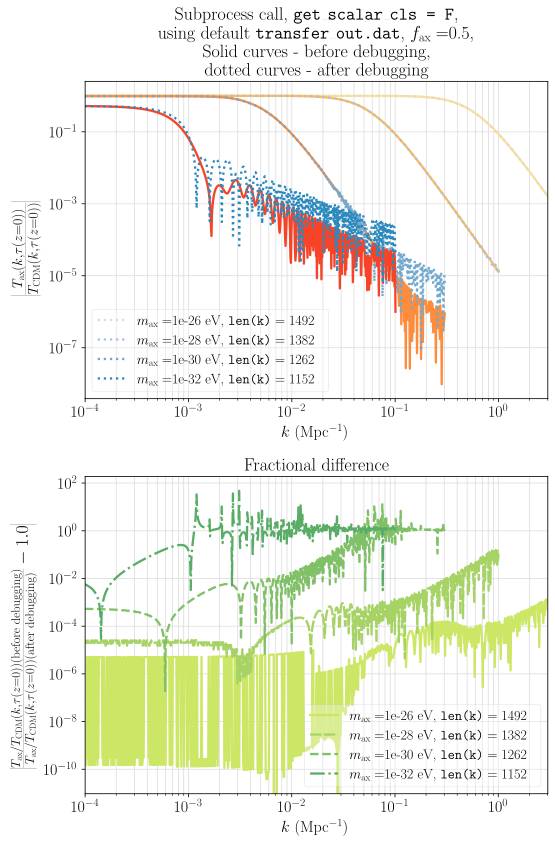

In [8]:
#Dimensionless hubble from the params.ini file
h = 67.31/100.00
get_scalar_cls_list = ['T', 'F']# #use string here to put in the call command
m_ax_list = ['1.e-26', '1.e-28', '1.e-30', '1.e-32']#use string here to put in the call command 
m_ax_label_list = [m_axitem.replace('.', '') for m_axitem in m_ax_list] #To put in filenames
axfrac_list = ['1.e-3', '0.1', '0.5', '1.0'] #use string here to put in the call command 
                                            # (or else python would set it to zero)
axfrac_label_list_temp = [axfrac_item.replace('.e', 'e') for axfrac_item in axfrac_list] 
axfrac_label_list = [axfrac_item.replace('.', 'd') for axfrac_item in axfrac_label_list_temp] #To put in filenames
#Range of maximum k corresponding to the respoective axion masses,
#(for purposes of showing the best range of the transfer function)
kmax_list = [3, 1, 0.3, 0.1] 

#Define colormap and linestyle
colorsax0 = plt.cm.YlOrRd(np.linspace(0.2, 0.8, len(m_ax_label_list) + 1))
colorsax1 = plt.cm.PuBu(np.linspace(0.2, 0.8, len(m_ax_label_list) + 1))
colorscdm = plt.cm.bone(np.linspace(0.4, 0.8, len(m_ax_label_list) + 1))
colorsdiff = plt.cm.summer(np.linspace(0.8, 0.2, len(m_ax_label_list) + 1))
linescdm = ['solid', (0, (5, 1)), 'dashed', 'dashdot', (0, (3, 5, 1, 5, 1, 5)), 'dotted', (0, (5, 10))]

#Preset False
get_scalar_cls = 'F'

axfrac = '0.5'
axfrac_label = '0d5'
fig, axs = plt.subplots(2, figsize = (8, 12))
for j in range(len(m_ax_list)):
    m_ax_label = m_ax_label_list[j]
    #Transfer function before debugging
    os.chdir('/Users/ra_yne/research/axionEFA/axionCAMB_nochangesintended')
    Transfer_kh_before, Transfer_cdm_before,Transfer_b_before,Transfer_g_before, Transfer_r_before, \
    Transfer_nu_before, Transfer_axion_before, Transfer_after_before, Transfer_tot_before = \
    np.loadtxt('transfer_max=%seV_axfrac=%s_getscalarcls=%s.dat'\
                        %(m_ax_label, axfrac_label, get_scalar_cls), unpack = True)
    #Transfer function after debugging
    os.chdir(\
'/Users/ra_yne/research/axionEFA/axionCAMB_recloned_fixedbackgroundderivs_fixedmassiveneutrinos_fixedsvec_fixedTCMB')
    Transfer_kh_after, Transfer_cdm_after,Transfer_b_after,Transfer_g_after, Transfer_r_after, Transfer_nu_after, \
    Transfer_axion_after, Transfer_after_after, Transfer_tot_after = \
    np.loadtxt('postdebug_transfer_max=%seV_axfrac=%s_getscalarcls=%s.dat'\
                        %(m_ax_label, axfrac_label, get_scalar_cls), unpack = True)
    #Check that I have imposed the same ks
    print(np.all(Transfer_kh_before==Transfer_kh_after)) 

    axs[0].plot(Transfer_kh_before*h, abs(Transfer_axion_before/Transfer_cdm_before), color = colorsax0[j])
    axs[0].plot(Transfer_kh_after*h , abs(Transfer_axion_after/Transfer_cdm_after), color = colorsax1[j], \
                linestyle = 'dotted', label = r'$m_\text{ax} = $%s eV, '\
                %m_ax_label + r'$\texttt{len(k)} = %i$'%len(Transfer_kh_after))
    axs[1].plot(Transfer_kh_after*h , \
                abs(Transfer_axion_before*Transfer_cdm_after/(Transfer_axion_after*Transfer_cdm_before) - 1.), \
                color = colorsdiff[j], linestyle = linescdm[j], label = r'$m_\text{ax} = $%s eV, '\
                %m_ax_label + r'$\texttt{len(k)} = %i$'%len(Transfer_kh_after))

axs[0].legend(fontsize = 14, loc = 'lower left', fancybox=True, framealpha=0.3) 
axs[0].set_xscale('log')
axs[0].set_yscale('log')
#axs.set_yscale('symlog', linthresh = 1e-33)
axs[0].set_xlim((1e-4, 3))
#axs[0].set_ylim(bottom = 3e-2)
axs[0].set_xlabel(r'$k$ (Mpc$^{-1}$)')
axs[0].set_ylabel(r'$\left|\frac{T_\text{ax}(k, \tau(z=0))}{T_\text{CDM}(k, \tau(z=0))}\right|$', fontsize = 20)
axs[0].set_title(r'Subprocess call, $\texttt{get\_scalar\_cls = %s}$,'%get_scalar_cls + \
          '\n' + r'using default $\texttt{transfer\_out.dat}$, $f_\text{ax} = $%s,'%axfrac +\
             '\n' + r'Solid curves - before debugging,' + \
             '\n' + r'dotted curves - after debugging', fontsize = 18)  
axs[0].grid(which = 'both')

axs[1].legend(fontsize = 14, loc = 'lower right', fancybox=True, framealpha=0.3) 
axs[1].set_xscale('log')
axs[1].set_yscale('log')
#axs.set_yscale('symlog', linthresh = 1e-33)
axs[1].set_xlim(left = 1e-4)
#axs[1].set_ylim(bottom = 3e-2)
axs[1].set_xlabel(r'$k$ (Mpc$^{-1}$)')
axs[1].set_ylabel(\
        r'$\left|\frac{T_\text{ax}/T_\text{CDM}(k, \tau(z=0))\text{(before debugging)}}' + \
                  r'{T_\text{ax}/T_\text{CDM}(k, \tau(z=0))\text{(after debugging)}} - 1.0\right|$', fontsize = 18)
axs[1].set_title(r'Fractional difference', fontsize = 18) 
axs[1].grid(which = 'both')
plt.tight_layout()
plt.show()

#### (Do we expect for 1e-32eV, this transfer function ratio doesn't reach 1 at small $k$ since it doesn't ever behave like CDM?)

<br>

<br>

<br>


### Scn. 3. $C_l$s

I did not turn on ``do_lensing``, so there is no BB spectrum, only TT, EE and TE.

#### TT

True
True
True
True


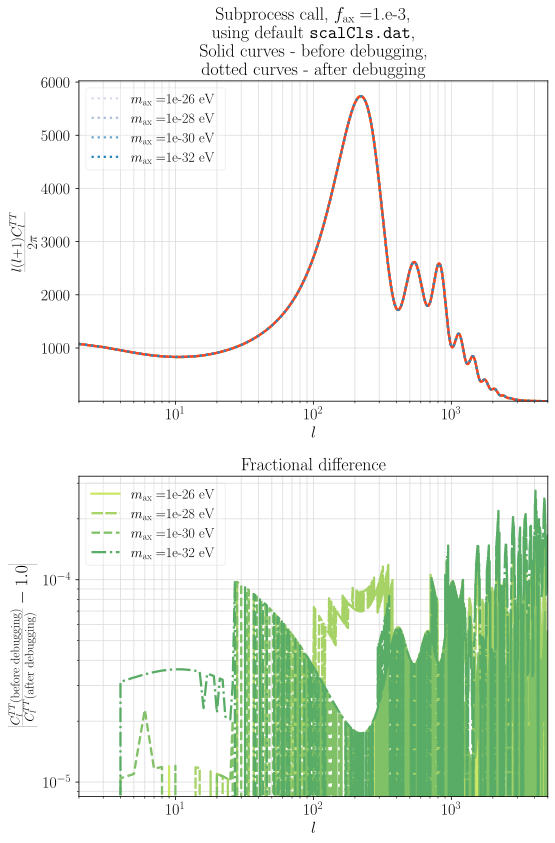

True
True
True
True


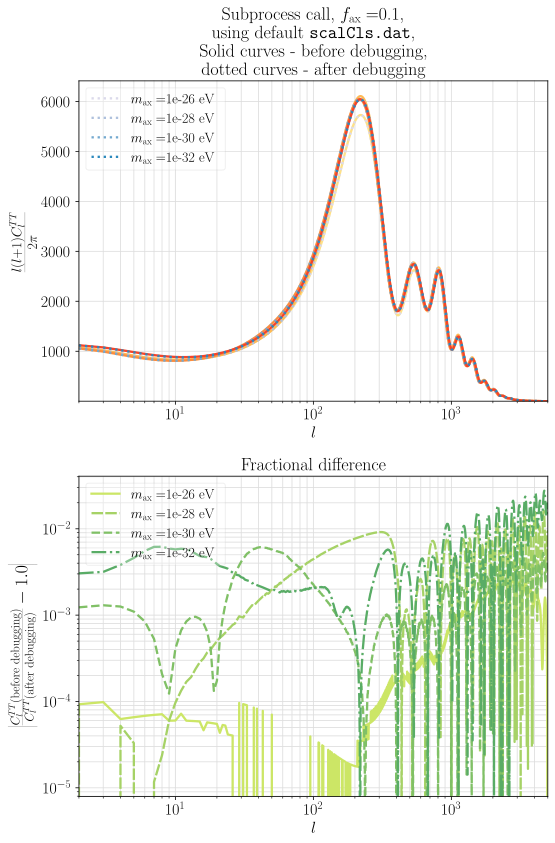

True
True
True
True


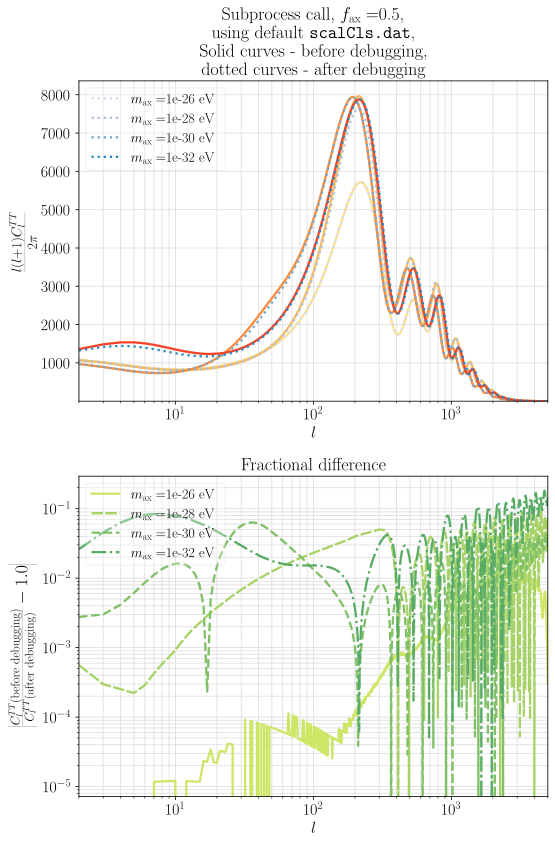

True
True
True
True


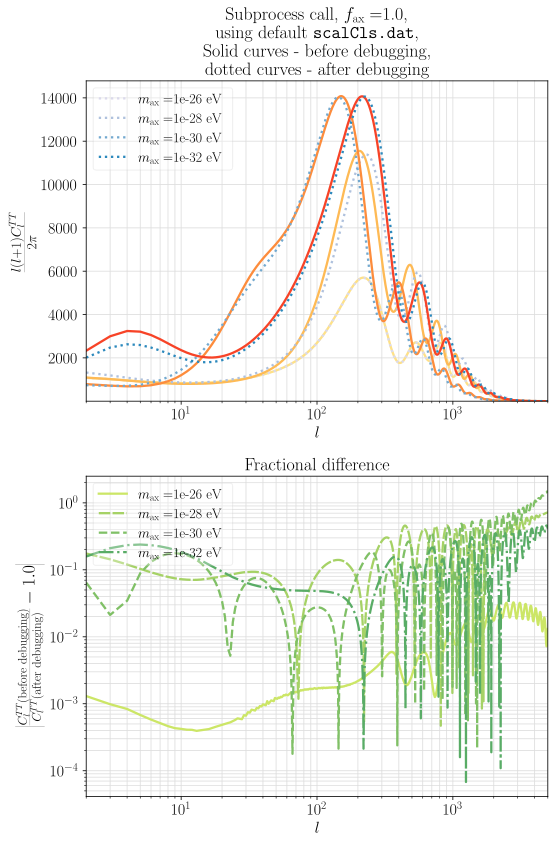

In [11]:
#Dimensionless hubble from the params.ini file
h = 67.31/100.00
get_scalar_cls_list = ['T', 'F']# Here it has to be 'T' but the filename doesn't have it anyways
m_ax_list = ['1.e-26', '1.e-28', '1.e-30', '1.e-32']#use string here to put in the call command 
m_ax_label_list = [m_axitem.replace('.', '') for m_axitem in m_ax_list] #To put in filenames
axfrac_list = ['1.e-3', '0.1', '0.5', '1.0'] #use string here to put in the call command 
                                            #(or else python would set it to zero)
axfrac_label_list_temp = [axfrac_item.replace('.e', 'e') for axfrac_item in axfrac_list] 
axfrac_label_list = [axfrac_item.replace('.', 'd') for axfrac_item in axfrac_label_list_temp] #To put in filenames
#Range of maximum k corresponding to the respoective axion masses,
#(for purposes of showing the best range of the transfer function)
kmax_list = [3, 1, 0.3, 0.1] 

#Define colormap and linestyle
colorsax0 = plt.cm.YlOrRd(np.linspace(0.2, 0.8, len(m_ax_label_list) + 1))
colorsax1 = plt.cm.PuBu(np.linspace(0.2, 0.8, len(m_ax_label_list) + 1))
colorscdm = plt.cm.bone(np.linspace(0.4, 0.8, len(m_ax_label_list) + 1))
colorsdiff = plt.cm.summer(np.linspace(0.8, 0.2, len(m_ax_label_list) + 1))
linescdm = ['solid', (0, (5, 1)), 'dashed', 'dashdot', (0, (3, 5, 1, 5, 1, 5)), 'dotted', (0, (5, 10))]

#Loop over the axion fraction
for i in range(len(axfrac_list)):
    axfrac = axfrac_list[i]
    axfrac_label = axfrac_label_list[i]
    fig, axs = plt.subplots(2, figsize = (8, 12))
    for j in range(len(m_ax_list)):
        m_ax_label = m_ax_label_list[j]
        #Cls before debugging
        os.chdir('/Users/ra_yne/research/axionEFA/axionCAMB_nochangesintended')
        l_before, TT_before, EE_before, TE_before = np.loadtxt('scalCls_max=%seV_axfrac=%s.dat'\
                                                               %(m_ax_label, axfrac_label), unpack = True)
        #Cls after debugging
        os.chdir(\
    '/Users/ra_yne/research/axionEFA/axionCAMB_recloned_fixedbackgroundderivs_fixedmassiveneutrinos_fixedsvec_fixedTCMB')
        l_after, TT_after, EE_after, TE_after = np.loadtxt('postdebug_scalCls_max=%seV_axfrac=%s.dat'\
                                                               %(m_ax_label, axfrac_label), unpack = True)
        #Check that I have imposed the same ls
        print(np.all(l_before==l_after)) 
        
        axs[0].plot(l_before, TT_before, color = colorsax0[j])
        axs[0].plot(l_after, TT_after,  color = colorsax1[j], linestyle = 'dotted', \
                    label = r'$m_\text{ax} = $%s eV'%m_ax_label)
        axs[1].plot(l_after, abs(TT_before/TT_after - 1.), color = colorsdiff[j], linestyle = linescdm[j], \
                    label = r'$m_\text{ax} = $%s eV'%m_ax_label)
       
    axs[0].legend(fontsize = 14, loc = 'upper left', fancybox=True, framealpha=0.3) 
    axs[0].set_xscale('log')
    #axs[0].set_yscale('log')
    #axs.set_yscale('symlog', linthresh = 1e-33)
    #axs[0].set_xlim(left = 1e-4)
    axs[0].set_ylim(bottom = 1e-2)
    axs[0].set_xlabel(r'$l$')
    axs[0].set_ylabel(r'$\frac{l(l+1)C_l^{TT}}{2\pi}$', fontsize = 20)
    axs[0].set_title(r'Subprocess call, $f_\text{ax} = $%s,'%axfrac + \
              '\n' + r'using default $\texttt{scalCls.dat}$,' +\
                 '\n' + r'Solid curves - before debugging,' + \
                 '\n' + r'dotted curves - after debugging', fontsize = 18)  
    axs[0].grid(which = 'both')

    axs[1].legend(fontsize = 14, loc = 'upper left', fancybox=True, framealpha=0.3) 
    axs[1].set_xscale('log')
    axs[1].set_yscale('log')
    #axs.set_yscale('symlog', linthresh = 1e-33)
    #axs[1].set_xlim(left = 1e-4)
    #axs[1].set_ylim(bottom = 1e-3)
    axs[1].set_xlabel(r'$l$')
    axs[1].set_ylabel(\
        r'$\left|\frac{C_l^{TT}\text{(before debugging)}}{C_l^{TT}\text{(after debugging)}} - 1.0\right|$', fontsize = 18)
    axs[1].set_title(r'Fractional difference', fontsize = 18) 
    axs[1].grid(which = 'both')
    plt.tight_layout()
    plt.show()

<br>

#### EE

True
True
True
True


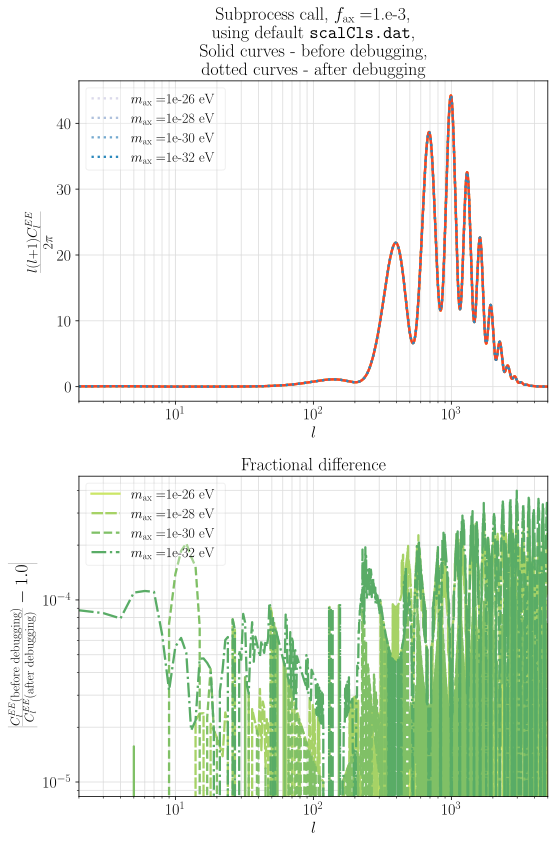

True
True
True
True


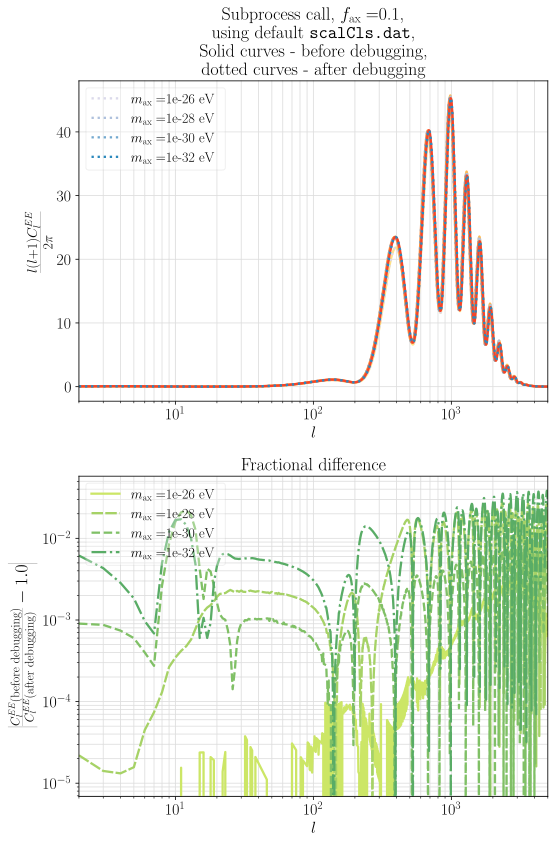

True
True
True
True


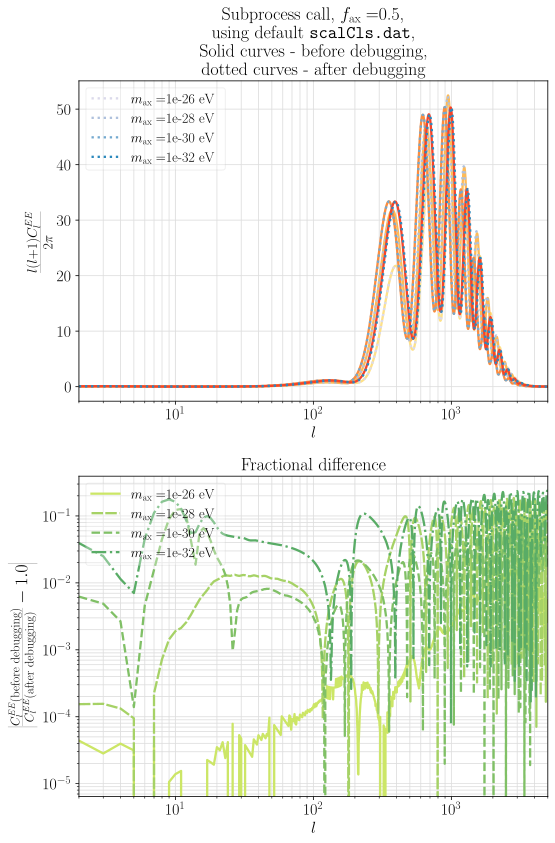

True
True
True
True


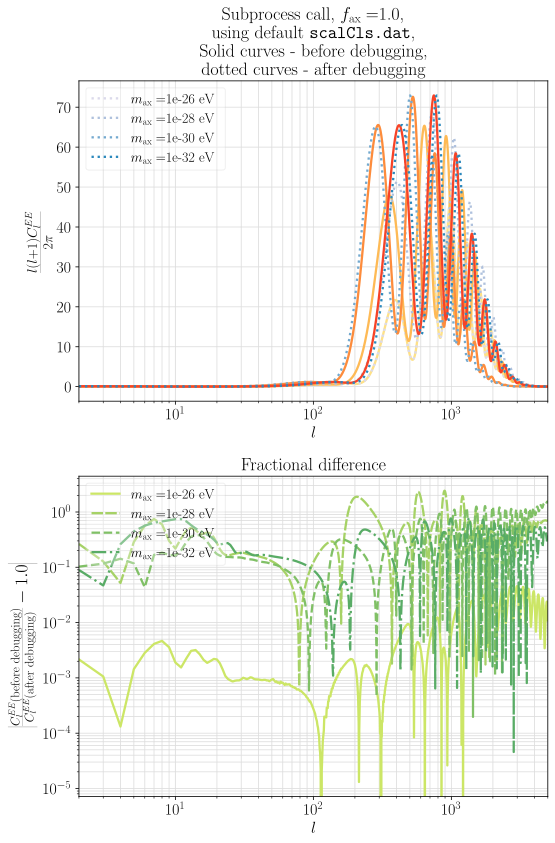

In [12]:
#Dimensionless hubble from the params.ini file
h = 67.31/100.00
get_scalar_cls_list = ['T', 'F']# Here it has to be 'T' but the filename doesn't have it anyways
m_ax_list = ['1.e-26', '1.e-28', '1.e-30', '1.e-32']#use string here to put in the call command 
m_ax_label_list = [m_axitem.replace('.', '') for m_axitem in m_ax_list] #To put in filenames
axfrac_list = ['1.e-3', '0.1', '0.5', '1.0'] #use string here to put in the call command 
                                            #(or else python would set it to zero)
axfrac_label_list_temp = [axfrac_item.replace('.e', 'e') for axfrac_item in axfrac_list] 
axfrac_label_list = [axfrac_item.replace('.', 'd') for axfrac_item in axfrac_label_list_temp] #To put in filenames
#Range of maximum k corresponding to the respoective axion masses,
#(for purposes of showing the best range of the transfer function)
kmax_list = [3, 1, 0.3, 0.1] 

#Define colormap and linestyle
colorsax0 = plt.cm.YlOrRd(np.linspace(0.2, 0.8, len(m_ax_label_list) + 1))
colorsax1 = plt.cm.PuBu(np.linspace(0.2, 0.8, len(m_ax_label_list) + 1))
colorscdm = plt.cm.bone(np.linspace(0.4, 0.8, len(m_ax_label_list) + 1))
colorsdiff = plt.cm.summer(np.linspace(0.8, 0.2, len(m_ax_label_list) + 1))
linescdm = ['solid', (0, (5, 1)), 'dashed', 'dashdot', (0, (3, 5, 1, 5, 1, 5)), 'dotted', (0, (5, 10))]

#Loop over the axion fraction
for i in range(len(axfrac_list)):
    axfrac = axfrac_list[i]
    axfrac_label = axfrac_label_list[i]
    fig, axs = plt.subplots(2, figsize = (8, 12))
    for j in range(len(m_ax_list)):
        m_ax_label = m_ax_label_list[j]
        #Cls before debugging
        os.chdir('/Users/ra_yne/research/axionEFA/axionCAMB_nochangesintended')
        l_before, TT_before, EE_before, TE_before = np.loadtxt('scalCls_max=%seV_axfrac=%s.dat'\
                                                               %(m_ax_label, axfrac_label), unpack = True)
        #Cls after debugging
        os.chdir(\
    '/Users/ra_yne/research/axionEFA/axionCAMB_recloned_fixedbackgroundderivs_fixedmassiveneutrinos_fixedsvec_fixedTCMB')
        l_after, TT_after, EE_after, TE_after = np.loadtxt('postdebug_scalCls_max=%seV_axfrac=%s.dat'\
                                                               %(m_ax_label, axfrac_label), unpack = True)
        #Check that I have imposed the same ls
        print(np.all(l_before==l_after)) 
        
        axs[0].plot(l_before, EE_before, color = colorsax0[j])
        axs[0].plot(l_after, EE_after,  color = colorsax1[j], linestyle = 'dotted', \
                    label = r'$m_\text{ax} = $%s eV'%m_ax_label)
        axs[1].plot(l_after, abs(EE_before/EE_after - 1.), color = colorsdiff[j], linestyle = linescdm[j], \
                    label = r'$m_\text{ax} = $%s eV'%m_ax_label)
       
    axs[0].legend(fontsize = 14, loc = 'upper left', fancybox=True, framealpha=0.3) 
    axs[0].set_xscale('log')
    #axs[0].set_yscale('log')
    #axs.set_yscale('symlog', linthresh = 1e-33)
    #axs[0].set_xlim(left = 1e-4)
    #axs[0].set_ylim(bottom = 1e-2)
    axs[0].set_xlabel(r'$l$')
    axs[0].set_ylabel(r'$\frac{l(l+1)C_l^{EE}}{2\pi}$', fontsize = 20)
    axs[0].set_title(r'Subprocess call, $f_\text{ax} = $%s,'%axfrac + \
              '\n' + r'using default $\texttt{scalCls.dat}$,' +\
                 '\n' + r'Solid curves - before debugging,' + \
                 '\n' + r'dotted curves - after debugging', fontsize = 18)  
    axs[0].grid(which = 'both')

    axs[1].legend(fontsize = 14, loc = 'upper left', fancybox=True, framealpha=0.3) 
    axs[1].set_xscale('log')
    axs[1].set_yscale('log')
    #axs.set_yscale('symlog', linthresh = 1e-33)
    #axs[1].set_xlim(left = 1e-4)
    #axs[1].set_ylim(bottom = 1e-3)
    axs[1].set_xlabel(r'$l$')
    axs[1].set_ylabel(\
        r'$\left|\frac{C_l^{EE}\text{(before debugging)}}{C_l^{EE}\text{(after debugging)}} - 1.0\right|$', fontsize = 18)
    axs[1].set_title(r'Fractional difference', fontsize = 18) 
    axs[1].grid(which = 'both')
    plt.tight_layout()
    plt.show()

<br>

#### TE

True
True
True
True


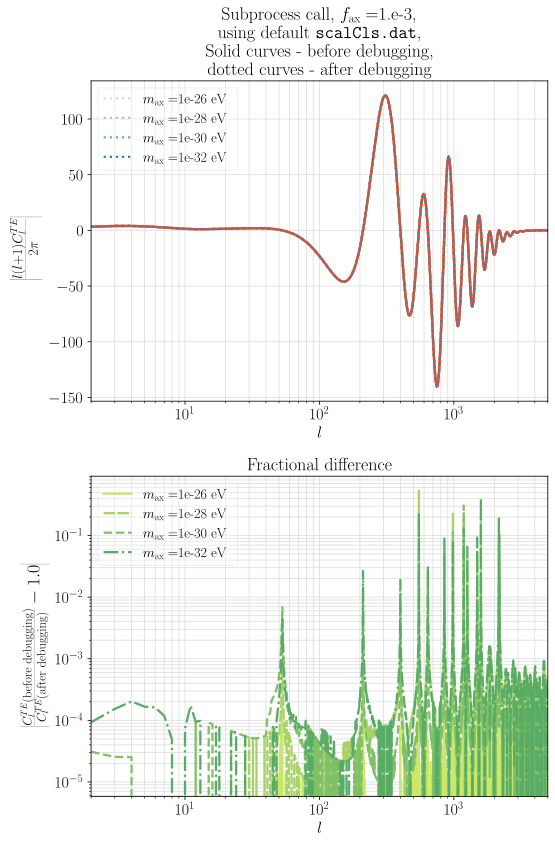

True
True
True
True


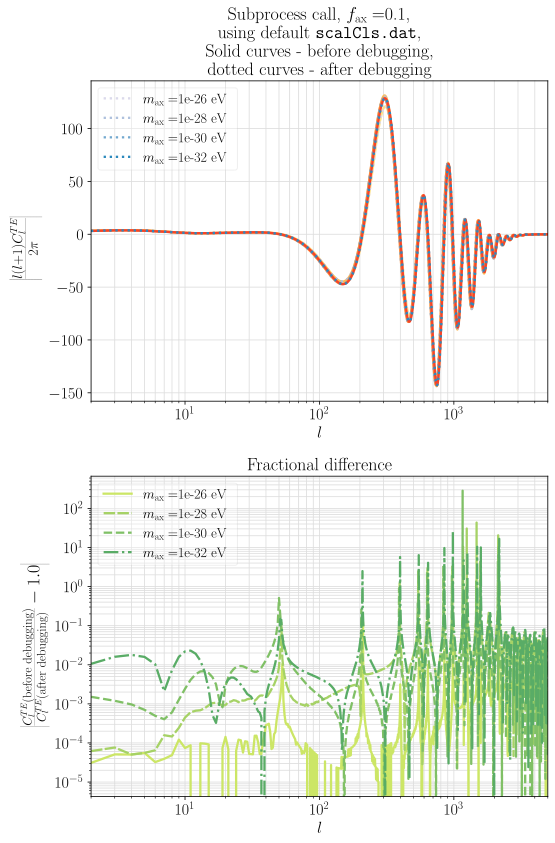

True
True
True
True


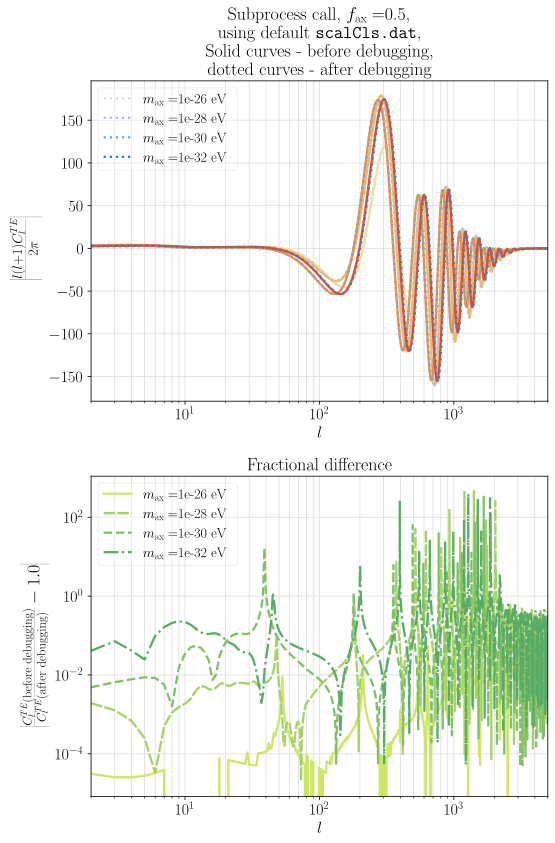

True
True
True
True


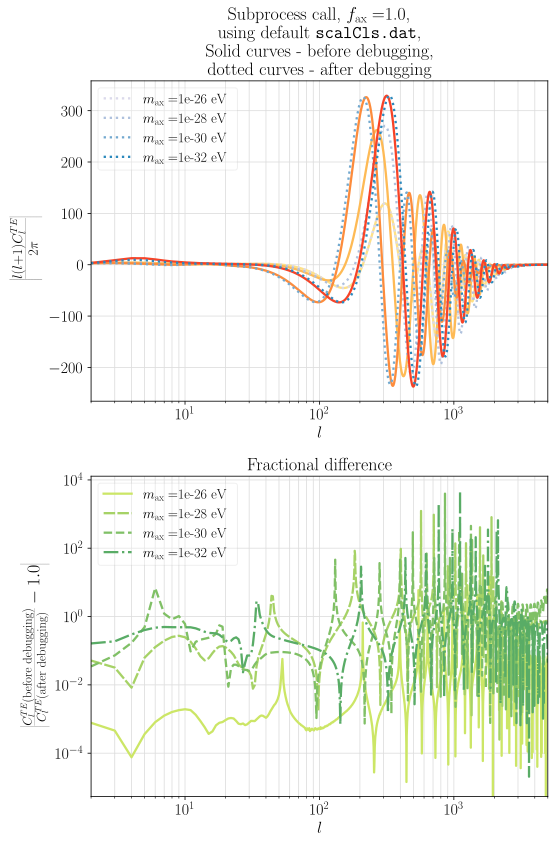

In [13]:
#Dimensionless hubble from the params.ini file
h = 67.31/100.00
get_scalar_cls_list = ['T', 'F']# Here it has to be 'T' but the filename doesn't have it anyways
m_ax_list = ['1.e-26', '1.e-28', '1.e-30', '1.e-32']#use string here to put in the call command 
m_ax_label_list = [m_axitem.replace('.', '') for m_axitem in m_ax_list] #To put in filenames
axfrac_list = ['1.e-3', '0.1', '0.5', '1.0'] #use string here to put in the call command 
                                            #(or else python would set it to zero)
axfrac_label_list_temp = [axfrac_item.replace('.e', 'e') for axfrac_item in axfrac_list] 
axfrac_label_list = [axfrac_item.replace('.', 'd') for axfrac_item in axfrac_label_list_temp] #To put in filenames
#Range of maximum k corresponding to the respoective axion masses,
#(for purposes of showing the best range of the transfer function)
kmax_list = [3, 1, 0.3, 0.1] 

#Define colormap and linestyle
colorsax0 = plt.cm.YlOrRd(np.linspace(0.2, 0.8, len(m_ax_label_list) + 1))
colorsax1 = plt.cm.PuBu(np.linspace(0.2, 0.8, len(m_ax_label_list) + 1))
colorscdm = plt.cm.bone(np.linspace(0.4, 0.8, len(m_ax_label_list) + 1))
colorsdiff = plt.cm.summer(np.linspace(0.8, 0.2, len(m_ax_label_list) + 1))
linescdm = ['solid', (0, (5, 1)), 'dashed', 'dashdot', (0, (3, 5, 1, 5, 1, 5)), 'dotted', (0, (5, 10))]

#Loop over the axion fraction
for i in range(len(axfrac_list)):
    axfrac = axfrac_list[i]
    axfrac_label = axfrac_label_list[i]
    fig, axs = plt.subplots(2, figsize = (8, 12))
    for j in range(len(m_ax_list)):
        m_ax_label = m_ax_label_list[j]
        #Cls before debugging
        os.chdir('/Users/ra_yne/research/axionEFA/axionCAMB_nochangesintended')
        l_before, TT_before, TE_before, TE_before = np.loadtxt('scalCls_max=%seV_axfrac=%s.dat'\
                                                               %(m_ax_label, axfrac_label), unpack = True)
        #Cls after debugging
        os.chdir(\
    '/Users/ra_yne/research/axionEFA/axionCAMB_recloned_fixedbackgroundderivs_fixedmassiveneutrinos_fixedsvec_fixedTCMB')
        l_after, TT_after, TE_after, TE_after = np.loadtxt('postdebug_scalCls_max=%seV_axfrac=%s.dat'\
                                                               %(m_ax_label, axfrac_label), unpack = True)
        #Check that I have imposed the same ls
        print(np.all(l_before==l_after)) 
        
        axs[0].plot(l_before, TE_before, color = colorsax0[j])
        axs[0].plot(l_after, TE_after,  color = colorsax1[j], linestyle = 'dotted', \
                    label = r'$m_\text{ax} = $%s eV'%m_ax_label)
        axs[1].plot(l_after, abs(TE_before/TE_after - 1.), color = colorsdiff[j], linestyle = linescdm[j], \
                    label = r'$m_\text{ax} = $%s eV'%m_ax_label)
       
    axs[0].legend(fontsize = 14, loc = 'upper left', fancybox=True, framealpha=0.3) 
    axs[0].set_xscale('log')
    #axs[0].set_yscale('log')
    #axs.set_yscale('symlog', linthresh = 1e-33)
    #axs[0].set_xlim(left = 1e-4)
    #axs[0].set_ylim(bottom = 1e-2)
    axs[0].set_xlabel(r'$l$')
    axs[0].set_ylabel(r'$\left|\frac{l(l+1)C_l^{TE}}{2\pi}\right|$', fontsize = 20)
    axs[0].set_title(r'Subprocess call, $f_\text{ax} = $%s,'%axfrac + \
              '\n' + r'using default $\texttt{scalCls.dat}$,' +\
                 '\n' + r'Solid curves - before debugging,' + \
                 '\n' + r'dotted curves - after debugging', fontsize = 18)  
    axs[0].grid(which = 'both')

    axs[1].legend(fontsize = 14, loc = 'upper left', fancybox=True, framealpha=0.3) 
    axs[1].set_xscale('log')
    axs[1].set_yscale('log')
    #axs.set_yscale('symlog', linthresh = 1e-33)
    #axs[1].set_xlim(left = 1e-4)
    #axs[1].set_ylim(bottom = 1e-3)
    axs[1].set_xlabel(r'$l$')
    axs[1].set_ylabel(\
        r'$\left|\frac{C_l^{TE}\text{(before debugging)}}{C_l^{TE}\text{(after debugging)}} - 1.0\right|$', fontsize = 18)
    axs[1].set_title(r'Fractional difference', fontsize = 18) 
    axs[1].grid(which = 'both')
    plt.tight_layout()
    plt.show()

<br>

<br>

<br>


### Scn. 5. $P_k$

The $k$ for matter power spectrum doesn't seem to be affected as much by whether I want $C_l$s. For ``get_scalar_cls = T`` I can obtain the fractional differences up until $m_\text{ax} = $ 1e-30 eV when the $k$ starts to differ. The $k$s are still very much sparser than the input desired transfer $k$s under ``get_scalar_cls = F``. I didn't scrutinize how their $k$ is sampled yet. Below is still under ``get_scalar_cls = F``.

True
True
True
True


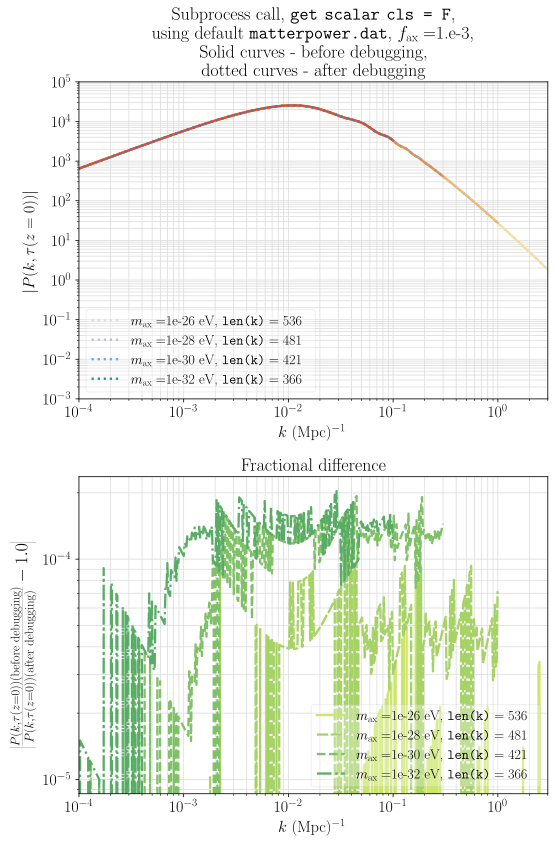

True
True
True
True


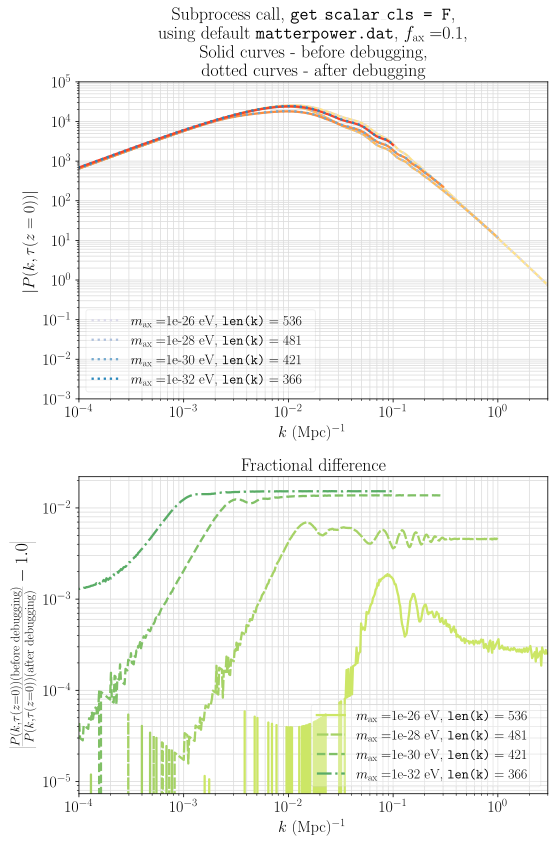

True
True
True
True


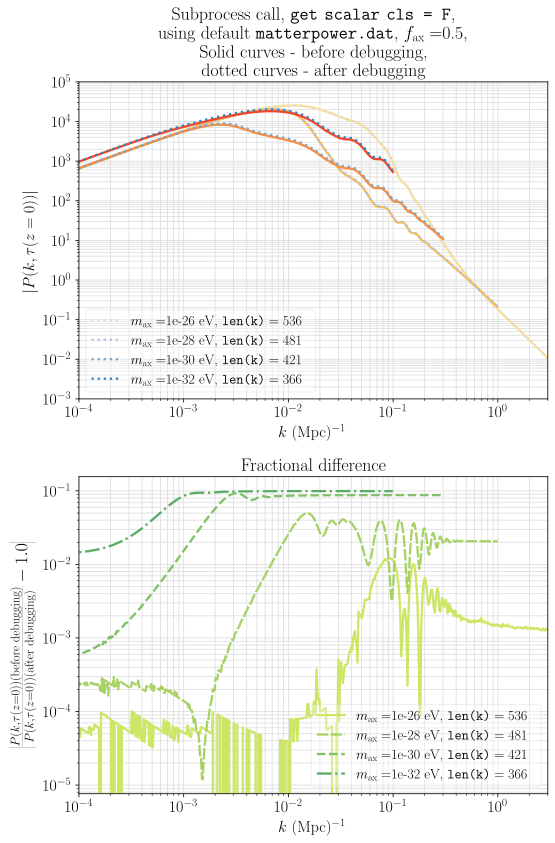

True
True
True
True


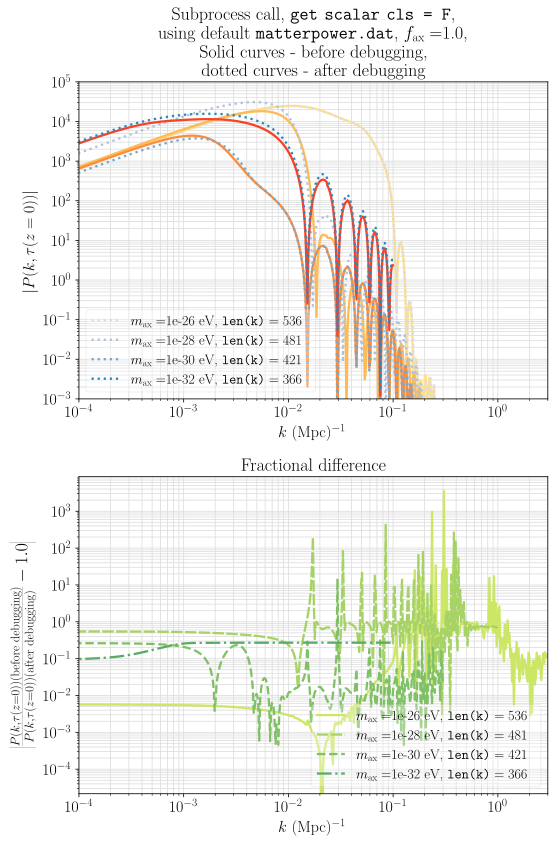

In [14]:
#Dimensionless hubble from the params.ini file
h = 67.31/100.00
get_scalar_cls_list = ['T', 'F']# #use string here to put in the call command
m_ax_list = ['1.e-26', '1.e-28', '1.e-30', '1.e-32']#use string here to put in the call command 
m_ax_label_list = [m_axitem.replace('.', '') for m_axitem in m_ax_list] #To put in filenames
axfrac_list = ['1.e-3', '0.1', '0.5', '1.0'] #use string here to put in the call command 
                                            # (or else python would set it to zero)
axfrac_label_list_temp = [axfrac_item.replace('.e', 'e') for axfrac_item in axfrac_list] 
axfrac_label_list = [axfrac_item.replace('.', 'd') for axfrac_item in axfrac_label_list_temp] #To put in filenames
#Range of maximum k corresponding to the respoective axion masses,
#(for purposes of showing the best range of the transfer function)
kmax_list = [3, 1, 0.3, 0.1] 

#Define colormap and linestyle
colorsax0 = plt.cm.YlOrRd(np.linspace(0.2, 0.8, len(m_ax_label_list) + 1))
colorsax1 = plt.cm.PuBu(np.linspace(0.2, 0.8, len(m_ax_label_list) + 1))
colorscdm = plt.cm.bone(np.linspace(0.4, 0.8, len(m_ax_label_list) + 1))
colorsdiff = plt.cm.summer(np.linspace(0.8, 0.2, len(m_ax_label_list) + 1))
linescdm = ['solid', (0, (5, 1)), 'dashed', 'dashdot', (0, (3, 5, 1, 5, 1, 5)), 'dotted', (0, (5, 10))]

#Preset False
get_scalar_cls = 'F'

#Loop over the axion fraction
for i in range(len(axfrac_list)):
    axfrac = axfrac_list[i]
    axfrac_label = axfrac_label_list[i]
    fig, axs = plt.subplots(2, figsize = (8, 12))
    for j in range(len(m_ax_list)):
        m_ax_label = m_ax_label_list[j]
        #Transfer function before debugging
        os.chdir('/Users/ra_yne/research/axionEFA/axionCAMB_nochangesintended')
        kh_before, Pk_before = np.loadtxt('matterpower_max=%seV_axfrac=%s_getscalarcls=%s.dat'\
                            %(m_ax_label, axfrac_label, get_scalar_cls), unpack = True)
        #Transfer function after debugging
        os.chdir(\
    '/Users/ra_yne/research/axionEFA/axionCAMB_recloned_fixedbackgroundderivs_fixedmassiveneutrinos_fixedsvec_fixedTCMB')
        kh_after, Pk_after = np.loadtxt('postdebug_matterpower_max=%seV_axfrac=%s_getscalarcls=%s.dat'\
                            %(m_ax_label, axfrac_label, get_scalar_cls), unpack = True)
        #Check that I have imposed the same ks
        print(np.all(kh_before==kh_after)) 
        
        axs[0].plot(kh_before*h, abs(Pk_before), color = colorsax0[j])
        axs[0].plot(kh_after*h , abs(Pk_after), color = colorsax1[j], linestyle = 'dotted', \
                    label = r'$m_\text{ax} = $%s eV, '%m_ax_label + r'$\texttt{len(k)} = %i$'%len(kh_after))
        axs[1].plot(kh_after*h , abs(Pk_before/Pk_after - 1.), color = colorsdiff[j], \
            linestyle = linescdm[j], label = r'$m_\text{ax} = $%s eV, '\
                    %m_ax_label + r'$\texttt{len(k)} = %i$'%len(kh_after))
       
    axs[0].legend(fontsize = 14, loc = 'lower left', fancybox=True, framealpha=0.3) 
    axs[0].set_xscale('log')
    axs[0].set_yscale('log')
    #axs.set_yscale('symlog', linthresh = 1e-33)
    axs[0].set_xlim((1e-4, 3.0))
    axs[0].set_ylim((1e-3, 1e5))
    axs[0].set_xlabel(r'$k$ (Mpc)$^{-1}$')
    axs[0].set_ylabel(r'$\left|P(k, \tau(z=0))\right|$')
    axs[0].set_title(r'Subprocess call, $\texttt{get\_scalar\_cls = %s}$,'%get_scalar_cls + \
              '\n' + r'using default $\texttt{matterpower.dat}$, $f_\text{ax} = $%s,'%axfrac +\
                 '\n' + r'Solid curves - before debugging,' + \
                 '\n' + r'dotted curves - after debugging', fontsize = 18)  
    axs[0].grid(which = 'both')

    axs[1].legend(fontsize = 14, loc = 'lower right', fancybox=True, framealpha=0.3) 
    axs[1].set_xscale('log')
    axs[1].set_yscale('log')
    #axs.set_yscale('symlog', linthresh = 1e-33)
    axs[1].set_xlim((1e-4, 3.0))
    #axs[1].set_ylim(bottom = 3e-2)
    axs[1].set_xlabel(r'$k$ (Mpc)$^{-1}$')
    axs[1].set_ylabel(\
            r'$\left|\frac{P(k, \tau(z=0))\text{(before debugging)}}' + \
                      r'{P(k, \tau(z=0))\text{(after debugging)}} - 1.0\right|$', fontsize = 18)
    axs[1].set_title(r'Fractional difference', fontsize = 18) 
    axs[1].grid(which = 'both')
    plt.tight_layout()
    plt.show()

<br>

<br>

<br>

#### <font text color = #911a1a> From the observables plotted above we can infer that for a $f_\text{ax}\sim 0.5$, the axionCAMB bugfixing brings about an impact of $\mathcal{O}(10^{-1})$ for the chosen axion mass range. Of all the observables, the transfer function is observed to be generally most sensitive to the bugfix, displaying an $\mathcal{O}(10^{-1})\sim\mathcal{O}(1)$ difference at $k\sim 0.1\text{Mpc}^{-1}$ even at a small $f_\text{ax}=10^{-3}$, while other observables, $C_l$s and $P_k$, keep a smaller From the observables plotted above we can infer that for a $f_\text{ax}\sim 0.5$, the axionCAMB bugfixing brings about an impact of $\mathcal{O}(10^{-1})$ for the chosen axion mass range. Of all the observables, the transfer function is observed to be generally most sensitive to the bugfix, displaying an $\mathcal{O}(10^{-1})\sim\mathcal{O}(1))$ difference at $k\sim 0.1\text{Mpc}^{-1}$ even at a small $f_\text{ax}=10^{-3}$. .</font>
    
<br>
    
#### <font text color = #911a1a> It is reasonably expected that the major impact of the bugfixing comes from the background KG fix. Hence in the section that follows we repeat the axion transfer function comparison for a published axionCAMB with only the background KG fixed. </font>

<br>

<br>

<br>


### Scn. 6. Repteat Scn.s 3-5 with only the background KG fixed

#### Data generation

<br>

In practice, this is done by implementing the KG fix on a copy of the ``axionCAMB``without bugfixing, but already with the implanted subprocess procedure code. 

In [26]:
#IF YOU HAVE THE NEED TO CHANGE DIRECTORY, DO IT BEFORE CALLING SUBPROCESS
os.chdir('/Users/ra_yne/research/axionEFA/axionCAMB_onlyfixedKG')

#Dimensionless hubble from the params.ini file
h = 67.31/100.00

#Pre-set the parameters I might not need to modify for this cell - mind the order
l_max_scalar = 5000 
transfer_k_per_logint = 100 


#THE FOLLOWING ARE THE RANGES OF VARIABLES THAT ARE ACTUALLY VARYING. 
#We can make a smaller list to check if it works first
get_scalar_cls_list = ['T', 'F']# #use string here to put in the call command
m_ax_list = ['1.e-26', '1.e-28', '1.e-30', '1.e-32']#use string here to put in the call command 
m_ax_label_list = [m_axitem.replace('.', '') for m_axitem in m_ax_list] #To put in filenames
axfrac_list = ['1.e-3', '0.1', '0.5', '1.0'] #use string here to put in the call command 
                                            # (or else python would set it to zero)
axfrac_label_list_temp = [axfrac_item.replace('.e', 'e') for axfrac_item in axfrac_list] 
axfrac_label_list = [axfrac_item.replace('.', 'd') for axfrac_item in axfrac_label_list_temp] #To put in filenames
#print(axfrac_label_list)
#Range of maximum k corresponding to the respoective axion masses,
#(for purposes of showing the best range of the transfer function)
#NOTE THAT THE INPUT K IN CAMB IS ACTUALLY KH. To obtain our desired k in Mpc^-1, divide our
#k by h before feeding it to CAMB.
kmax_list = [3, 1, 0.3, 0.1]


#Generate data
for i in range(len(get_scalar_cls_list)):
    get_scalar_cls = get_scalar_cls_list[i]
    for j in range(len(axfrac_list)):
        axfrac = axfrac_list[j]
        axfrac_label = axfrac_label_list[j]
        for k in range(len(m_ax_list)):
            m_ax_label = m_ax_label_list[k]
            
            #Can comment out the print statement if wanted, more for confirming/progress checking purposes
            print('./camb params.ini 1 %s 2 %i 3 %i 4 %s 5 %s 6 %s'%(get_scalar_cls, l_max_scalar, \
                                               transfer_k_per_logint, str(kmax_list[k]/h), m_ax_list[k], axfrac))
            subprocess.call('./camb params.ini 1 %s 2 %i 3 %i 4 %s 5 %s 6 %s'%(get_scalar_cls, l_max_scalar, \
                                               transfer_k_per_logint, str(kmax_list[k]/h), m_ax_list[k], axfrac), shell = True)
            #print('transfer_max=%seV_axfrac=%s_getscalarcls=%s.dat'%(m_ax_label, axfrac_label, get_scalar_cls))
            #Move transfer function files
            subprocess.call('mv test_transfer_out.dat onlyKGfix_transfer_max=%seV_axfrac=%s_getscalarcls=%s.dat'\
                            %(m_ax_label, axfrac_label, get_scalar_cls), shell = True)  
            #Move matter power spectrum files
            #print('matterpower_max=%seV_axfrac=%s_getscalarcls=%s.dat'%(m_ax_label, axfrac_label, get_scalar_cls))
            subprocess.call('mv test_matterpower.dat onlyKGfix_matterpower_max=%seV_axfrac=%s_getscalarcls=%s.dat'\
                            %(m_ax_label, axfrac_label, get_scalar_cls), shell = True)
            if get_scalar_cls == 'T':
                #Move scalar_cls files
                #print('scalCls_max=%seV_axfrac=%s.dat' %(m_ax_label, axfrac_label))
                subprocess.call('mv test_scalCls.dat onlyKGfix_scalCls_max=%seV_axfrac=%s.dat'%(m_ax_label, axfrac_label), \
                                shell = True)  

./camb params.ini 1 T 2 5000 3 100 4 4.456990046055564 5 1.e-26 6 1.e-3
./camb params.ini 1 T 2 5000 3 100 4 1.4856633486851878 5 1.e-28 6 1.e-3
./camb params.ini 1 T 2 5000 3 100 4 0.44569900460555634 5 1.e-30 6 1.e-3
./camb params.ini 1 T 2 5000 3 100 4 0.1485663348685188 5 1.e-32 6 1.e-3
./camb params.ini 1 T 2 5000 3 100 4 4.456990046055564 5 1.e-26 6 0.1
./camb params.ini 1 T 2 5000 3 100 4 1.4856633486851878 5 1.e-28 6 0.1
./camb params.ini 1 T 2 5000 3 100 4 0.44569900460555634 5 1.e-30 6 0.1
./camb params.ini 1 T 2 5000 3 100 4 0.1485663348685188 5 1.e-32 6 0.1
./camb params.ini 1 T 2 5000 3 100 4 4.456990046055564 5 1.e-26 6 0.5
./camb params.ini 1 T 2 5000 3 100 4 1.4856633486851878 5 1.e-28 6 0.5
./camb params.ini 1 T 2 5000 3 100 4 0.44569900460555634 5 1.e-30 6 0.5
./camb params.ini 1 T 2 5000 3 100 4 0.1485663348685188 5 1.e-32 6 0.5
./camb params.ini 1 T 2 5000 3 100 4 4.456990046055564 5 1.e-26 6 1.0
./camb params.ini 1 T 2 5000 3 100 4 1.4856633486851878 5 1.e-28 6 1.0

True
True
True
True


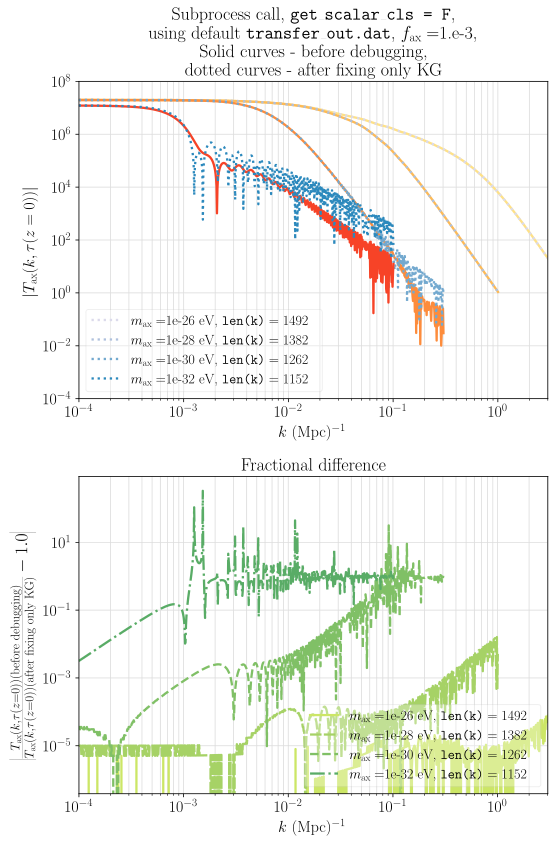

True
True
True
True


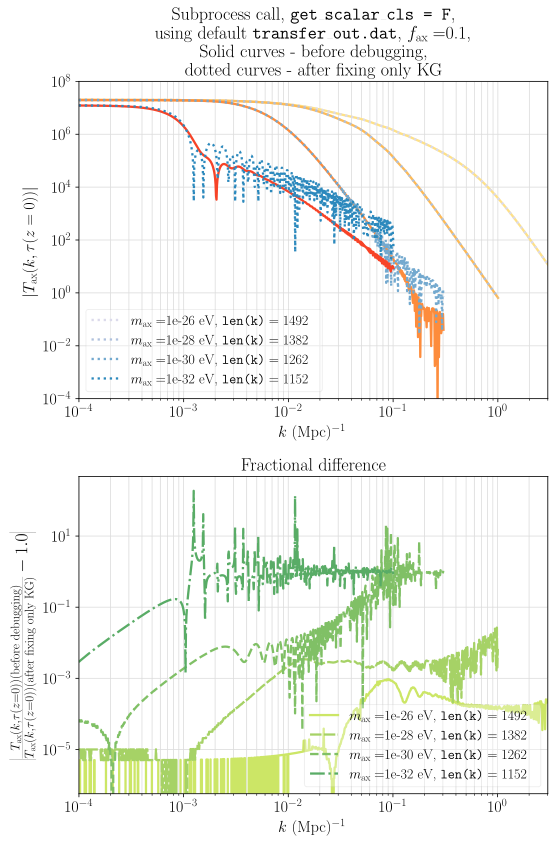

True
True
True
True


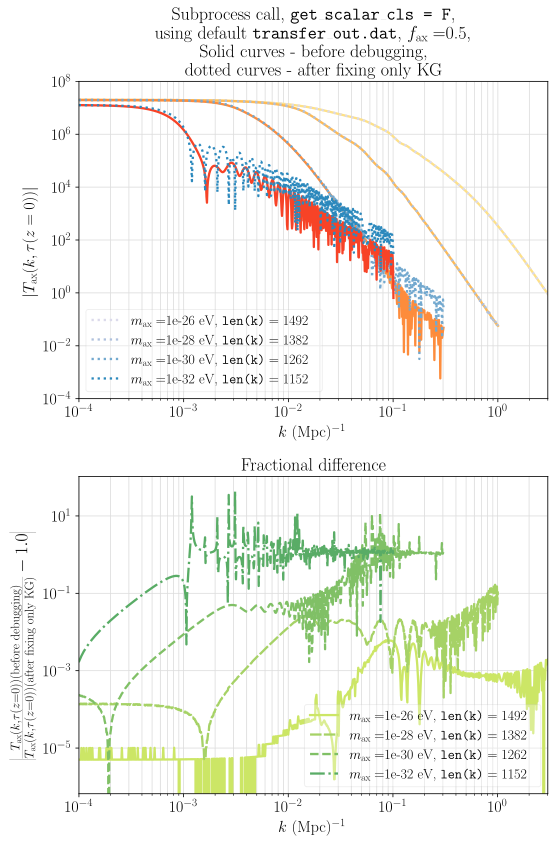

True
True
True
True


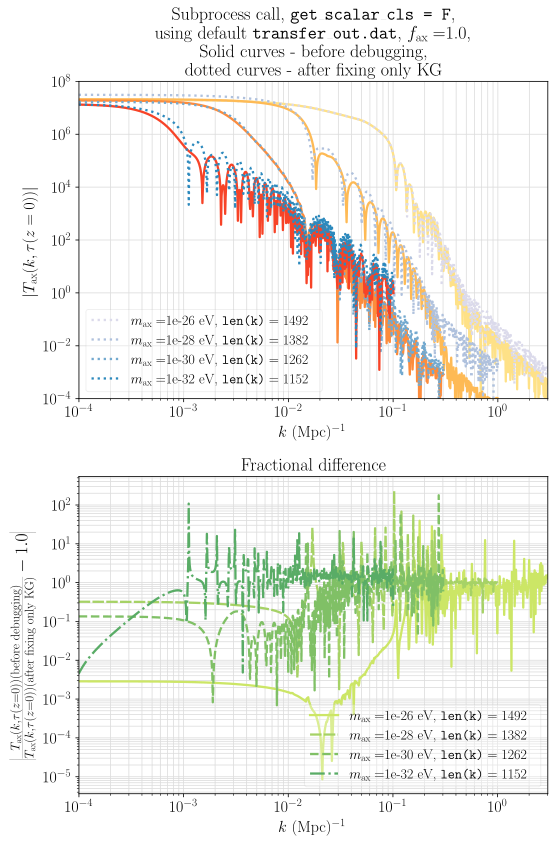

In [15]:
#Dimensionless hubble from the params.ini file
h = 67.31/100.00
get_scalar_cls_list = ['T', 'F']# #use string here to put in the call command
m_ax_list = ['1.e-26', '1.e-28', '1.e-30', '1.e-32']#use string here to put in the call command 
m_ax_label_list = [m_axitem.replace('.', '') for m_axitem in m_ax_list] #To put in filenames
axfrac_list = ['1.e-3', '0.1', '0.5', '1.0'] #use string here to put in the call command 
                                            # (or else python would set it to zero)
axfrac_label_list_temp = [axfrac_item.replace('.e', 'e') for axfrac_item in axfrac_list] 
axfrac_label_list = [axfrac_item.replace('.', 'd') for axfrac_item in axfrac_label_list_temp] #To put in filenames
#Range of maximum k corresponding to the respoective axion masses,
#(for purposes of showing the best range of the transfer function)
kmax_list = [3, 1, 0.3, 0.1] 

#Define colormap and linestyle
colorsax0 = plt.cm.YlOrRd(np.linspace(0.2, 0.8, len(m_ax_label_list) + 1))
colorsax1 = plt.cm.PuBu(np.linspace(0.2, 0.8, len(m_ax_label_list) + 1))
colorscdm = plt.cm.bone(np.linspace(0.4, 0.8, len(m_ax_label_list) + 1))
colorsdiff = plt.cm.summer(np.linspace(0.8, 0.2, len(m_ax_label_list) + 1))
linescdm = ['solid', (0, (5, 1)), 'dashed', 'dashdot', (0, (3, 5, 1, 5, 1, 5)), 'dotted', (0, (5, 10))]

#Preset False
get_scalar_cls = 'F'

#Loop over the axion fraction
for i in range(len(axfrac_list)):
    axfrac = axfrac_list[i]
    axfrac_label = axfrac_label_list[i]
    fig, axs = plt.subplots(2, figsize = (8, 12))
    for j in range(len(m_ax_list)):
        m_ax_label = m_ax_label_list[j]
        #Transfer function before debugging
        os.chdir('/Users/ra_yne/research/axionEFA/axionCAMB_nochangesintended')
        Transfer_kh_before, Transfer_cdm_before,Transfer_b_before,Transfer_g_before, Transfer_r_before, \
        Transfer_nu_before, Transfer_axion_before, Transfer_fixKG_before, Transfer_tot_before = \
        np.loadtxt('transfer_max=%seV_axfrac=%s_getscalarcls=%s.dat'\
                            %(m_ax_label, axfrac_label, get_scalar_cls), unpack = True)
        #Transfer function after only fixing KG
        os.chdir(\
    '/Users/ra_yne/research/axionEFA/axionCAMB_onlyfixedKG')
        Transfer_kh_fixKG, Transfer_cdm_fixKG,Transfer_b_fixKG,Transfer_g_fixKG, Transfer_r_fixKG, Transfer_nu_fixKG, \
        Transfer_axion_fixKG, Transfer_fixKG_fixKG, Transfer_tot_fixKG = \
        np.loadtxt('onlyKGfix_transfer_max=%seV_axfrac=%s_getscalarcls=%s.dat'\
                           %(m_ax_label, axfrac_label, get_scalar_cls), unpack = True)
        #Check that I have imposed the same ks
        print(np.all(Transfer_kh_before==Transfer_kh_fixKG)) 
        
        axs[0].plot(Transfer_kh_before*h, abs(Transfer_axion_before), color = colorsax0[j])
        axs[0].plot(Transfer_kh_fixKG*h , abs(Transfer_axion_fixKG), color = colorsax1[j], linestyle = 'dotted', \
                    label = r'$m_\text{ax} = $%s eV, '%m_ax_label + r'$\texttt{len(k)} = %i$'%len(Transfer_kh_fixKG))
        axs[1].plot(Transfer_kh_fixKG*h , abs(Transfer_axion_before/Transfer_axion_fixKG - 1.), color = colorsdiff[j], \
            linestyle = linescdm[j], label = r'$m_\text{ax} = $%s eV, '\
                    %m_ax_label + r'$\texttt{len(k)} = %i$'%len(Transfer_kh_fixKG))
       
    axs[0].legend(fontsize = 14, loc = 'lower left', fancybox=True, framealpha=0.3) 
    axs[0].set_xscale('log')
    axs[0].set_yscale('log')
    #axs.set_yscale('symlog', linthresh = 1e-33)
    axs[0].set_xlim((1e-4, 3.0))
    axs[0].set_ylim((1e-4, 1e8))
    axs[0].set_xlabel(r'$k$ (Mpc)$^{-1}$')
    axs[0].set_ylabel(r'$\left|T_\text{ax}(k, \tau(z=0))\right|$')
    axs[0].set_title(r'Subprocess call, $\texttt{get\_scalar\_cls = %s}$,'%get_scalar_cls + \
              '\n' + r'using default $\texttt{transfer\_out.dat}$, $f_\text{ax} = $%s,'%axfrac +\
                 '\n' + r'Solid curves - before debugging,' + \
                 '\n' + r'dotted curves - after fixing only KG', fontsize = 18)  
    axs[0].grid(which = 'both')

    axs[1].legend(fontsize = 14, loc = 'lower right', fancybox=True, framealpha=0.3) 
    axs[1].set_xscale('log')
    axs[1].set_yscale('log')
    #axs.set_yscale('symlog', linthresh = 1e-33)
    axs[1].set_xlim(left = 1e-4)
    #axs[1].set_ylim(bottom = 3e-2)
    axs[1].set_xlabel(r'$k$ (Mpc)$^{-1}$')
    axs[1].set_ylabel(\
            r'$\left|\frac{T_\text{ax}(k, \tau(z=0))\text{(before debugging)}}' + \
                      r'{T_\text{ax}(k, \tau(z=0))\text{(after fixing only KG)}} - 1.0\right|$', fontsize = 18)
    axs[1].set_title(r'Fractional difference', fontsize = 18) 
    axs[1].grid(which = 'both')
    plt.tight_layout()
    plt.show()

<br>

**The above fractional differences are very similar to that observed with all the bugfixes combined, hence our guess is suppported. To further validate this, let's compare the above version where only KG is fixed to that of the sum of all fixes.**

True
True
True
True


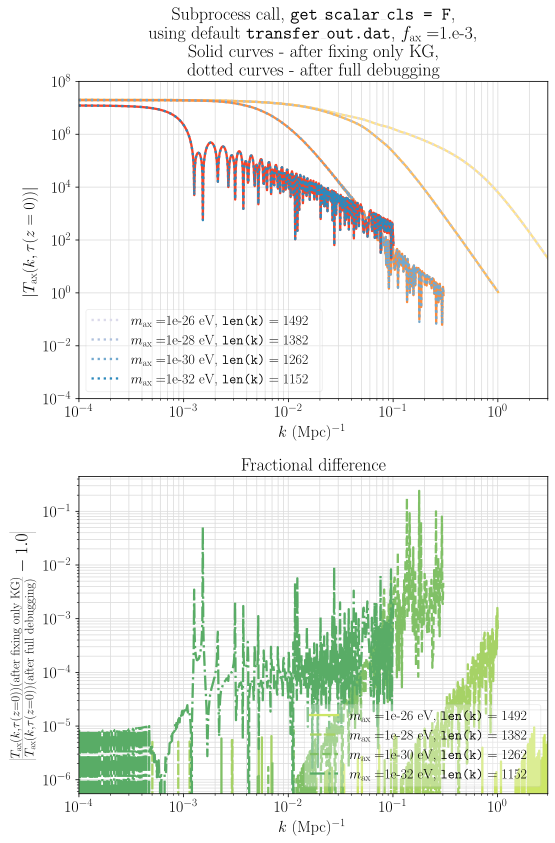

True
True
True
True


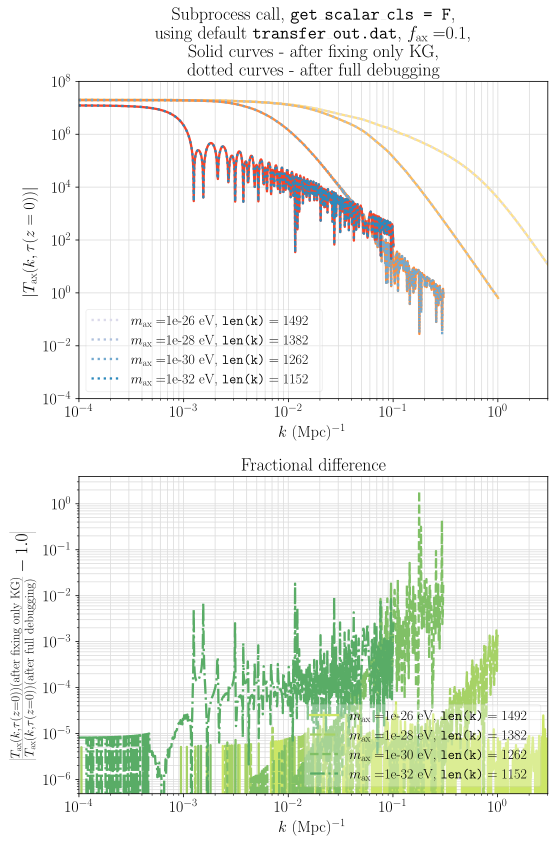

True
True
True
True


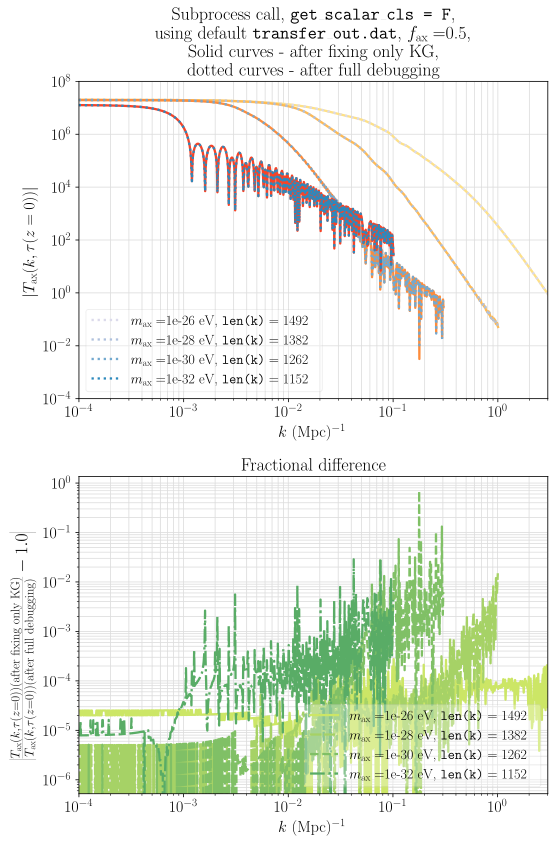

True
True
True
True


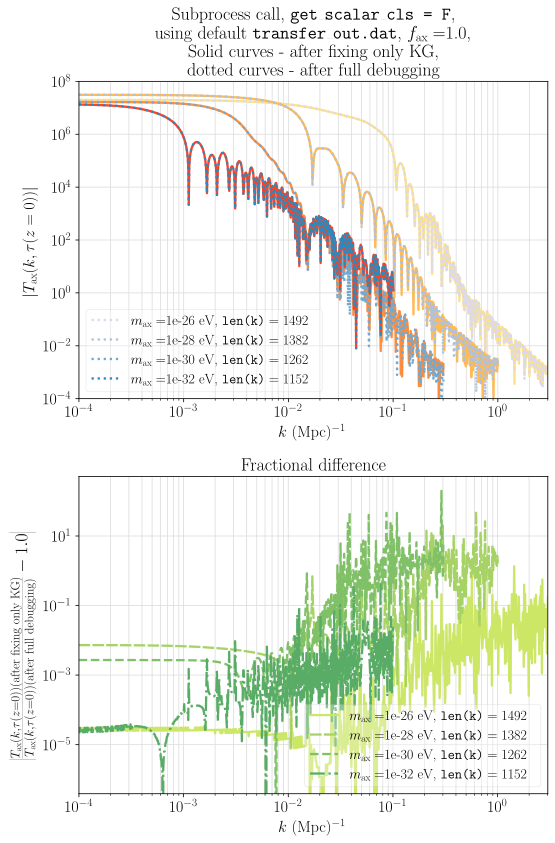

In [21]:
#Dimensionless hubble from the params.ini file
h = 67.31/100.00
get_scalar_cls_list = ['T', 'F']# #use string here to put in the call command
m_ax_list = ['1.e-26', '1.e-28', '1.e-30', '1.e-32']#use string here to put in the call command 
m_ax_label_list = [m_axitem.replace('.', '') for m_axitem in m_ax_list] #To put in filenames
axfrac_list = ['1.e-3', '0.1', '0.5', '1.0'] #use string here to put in the call command 
                                            # (or else python would set it to zero)
axfrac_label_list_temp = [axfrac_item.replace('.e', 'e') for axfrac_item in axfrac_list] 
axfrac_label_list = [axfrac_item.replace('.', 'd') for axfrac_item in axfrac_label_list_temp] #To put in filenames
#Range of maximum k corresponding to the respoective axion masses,
#(for purposes of showing the best range of the transfer function)
kmax_list = [3, 1, 0.3, 0.1] 

#Define colormap and linestyle
colorsax0 = plt.cm.YlOrRd(np.linspace(0.2, 0.8, len(m_ax_label_list) + 1))
colorsax1 = plt.cm.PuBu(np.linspace(0.2, 0.8, len(m_ax_label_list) + 1))
colorscdm = plt.cm.bone(np.linspace(0.4, 0.8, len(m_ax_label_list) + 1))
colorsdiff = plt.cm.summer(np.linspace(0.8, 0.2, len(m_ax_label_list) + 1))
linescdm = ['solid', (0, (5, 1)), 'dashed', 'dashdot', (0, (3, 5, 1, 5, 1, 5)), 'dotted', (0, (5, 10))]

#Preset False
get_scalar_cls = 'F'

#Loop over the axion fraction
for i in range(len(axfrac_list)):
    axfrac = axfrac_list[i]
    axfrac_label = axfrac_label_list[i]
    fig, axs = plt.subplots(2, figsize = (8, 12))
    for j in range(len(m_ax_list)):
        m_ax_label = m_ax_label_list[j]        
        #Transfer function after only fixing KG
        os.chdir(\
    '/Users/ra_yne/research/axionEFA/axionCAMB_onlyfixedKG')
        Transfer_kh_fixKG, Transfer_cdm_fixKG,Transfer_b_fixKG,Transfer_g_fixKG, Transfer_r_fixKG, Transfer_nu_fixKG, \
        Transfer_axion_fixKG, Transfer_fixKG_fixKG, Transfer_tot_fixKG = \
        np.loadtxt('onlyKGfix_transfer_max=%seV_axfrac=%s_getscalarcls=%s.dat'\
                           %(m_ax_label, axfrac_label, get_scalar_cls), unpack = True)
        #Transfer function after debugging
        os.chdir(\
    '/Users/ra_yne/research/axionEFA/axionCAMB_recloned_fixedbackgroundderivs_fixedmassiveneutrinos_fixedsvec_fixedTCMB')
        Transfer_kh_after, Transfer_cdm_after,Transfer_b_after,Transfer_g_after, Transfer_r_after, Transfer_nu_after, \
        Transfer_axion_after, Transfer_after_after, Transfer_tot_after = \
        np.loadtxt('postdebug_transfer_max=%seV_axfrac=%s_getscalarcls=%s.dat'\
                           %(m_ax_label, axfrac_label, get_scalar_cls), unpack = True)
        #Check that I have imposed the same ks
        print(np.all(Transfer_kh_fixKG==Transfer_kh_after)) 
        
        axs[0].plot(Transfer_kh_fixKG*h, abs(Transfer_axion_fixKG), color = colorsax0[j])
        axs[0].plot(Transfer_kh_after*h , abs(Transfer_axion_after), color = colorsax1[j], linestyle = 'dotted', \
                    label = r'$m_\text{ax} = $%s eV, '%m_ax_label + r'$\texttt{len(k)} = %i$'%len(Transfer_kh_after))
        axs[1].plot(Transfer_kh_after*h , abs(Transfer_axion_fixKG/Transfer_axion_after - 1.), color = colorsdiff[j], \
            linestyle = linescdm[j], label = r'$m_\text{ax} = $%s eV, '\
                    %m_ax_label + r'$\texttt{len(k)} = %i$'%len(Transfer_kh_fixKG))
       
    axs[0].legend(fontsize = 14, loc = 'lower left', fancybox=True, framealpha=0.3) 
    axs[0].set_xscale('log')
    axs[0].set_yscale('log')
    #axs.set_yscale('symlog', linthresh = 1e-33)
    axs[0].set_xlim((1e-4, 3.0))
    axs[0].set_ylim((1e-4, 1e8))
    axs[0].set_xlabel(r'$k$ (Mpc)$^{-1}$')
    axs[0].set_ylabel(r'$\left|T_\text{ax}(k, \tau(z=0))\right|$')
    axs[0].set_title(r'Subprocess call, $\texttt{get\_scalar\_cls = %s}$,'%get_scalar_cls + \
              '\n' + r'using default $\texttt{transfer\_out.dat}$, $f_\text{ax} = $%s,'%axfrac +\
                 '\n' + r'Solid curves - after fixing only KG,' + \
                 '\n' + r'dotted curves - after full debugging', fontsize = 18)  
    axs[0].grid(which = 'both')

    axs[1].legend(fontsize = 14, loc = 'lower right', fancybox=True, framealpha=0.3) 
    axs[1].set_xscale('log')
    axs[1].set_yscale('log')
    #axs.set_yscale('symlog', linthresh = 1e-33)
    axs[1].set_xlim(left = 1e-4)
    #axs[1].set_ylim(bottom = 3e-2)
    axs[1].set_xlabel(r'$k$ (Mpc)$^{-1}$')
    axs[1].set_ylabel(\
            r'$\left|\frac{T_\text{ax}(k, \tau(z=0))\text{(after fixing only KG)}}' + \
                      r'{T_\text{ax}(k, \tau(z=0))\text{(after full debugging)}} - 1.0\right|$', fontsize = 18)
    axs[1].set_title(r'Fractional difference', fontsize = 18) 
    axs[1].grid(which = 'both')
    plt.tight_layout()
    plt.show()

<br>

#### The remaining fractional difference becomes approximately smaller by one order of magnitude, although still non-negligible.

<br>

<br>

<br>



### Scn. 7. Check my subprocess run is consistent with my hand-change input run

This is done by 5 runs of a recloned version of ``axionCAMB`` with no changes, under $f_\text{ax} = 1.0$, $m_\text{ax}$ = 1e-19, 22, 25, 28, 31eV, ``get_scalar_cls = T``, with corresponding kmaxes as specified previously in the subprocess run demonstration. We pass the test by generating identical outputs as that done by the subprocess call.

``Transfer_manual`` are the output sets that I ran by manually setting the ``params.ini`` parameters in the non-debugged ``axionCAMB``. ``Transfer_sub`` are those I ran with subprocess above.

Are the two versions of transfer function exactly the same for max=1e-19eV, kmax=600?
True
Are the two versions of transfer function exactly the same for max=1e-22eV, kmax=100?
True
Are the two versions of transfer function exactly the same for max=1e-25eV, kmax=5?
True
Are the two versions of transfer function exactly the same for max=1e-28eV, kmax=1?
False
Are the two versions of transfer function exactly the same for max=1e-31eV, kmax=0d1?
True


<ipython-input-22-3b576a3b34ca>:27: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  print(np.all(Transfer_axion_sub == Transfer_axion_manual))


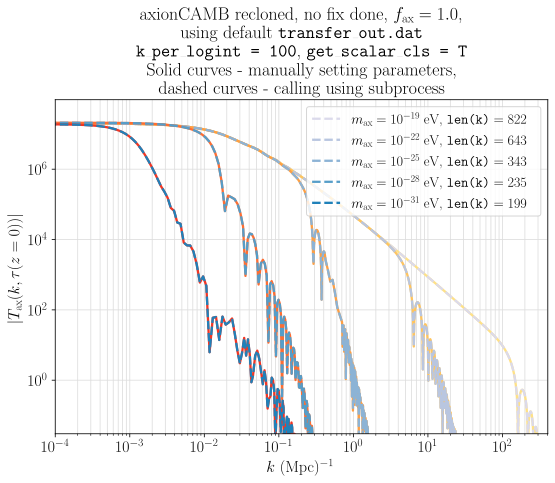

In [22]:
#Dimensionless hubble from the params.ini file
h = 67.31/100.00

m_exps = [19, 22, 25, 28, 31] #19, 22, 
kmaxes = ['600', '100', '5', '1', '0d1']#
#Define colormap and linestyle
colorsax0 = plt.cm.YlOrRd(np.linspace(0.2, 0.8, len(m_exps) + 1))
colorsax1 = plt.cm.PuBu(np.linspace(0.2, 0.8, len(m_exps) + 1))
colorscdm = plt.cm.bone(np.linspace(0.4, 0.8, len(m_exps) + 1))
colorsdiff = plt.cm.summer(np.linspace(0.2, 0.8, len(m_exps) + 1))
linescdm = ['solid', (0, (5, 1)), 'dashed', 'dashdot', (0, (3, 5, 1, 5, 1, 5)), 'dotted', (0, (5, 10))]

#Plot with respect to the scale factor
fig, axs = plt.subplots(1, figsize = (8, 7))

for i in range(0, len(m_exps)):
    m_exp = m_exps[i]
    kmax = kmaxes[i]
    Transfer_kh_manual, Transfer_cdm_manual,Transfer_b_manual,Transfer_g_manual, Transfer_r_manual, Transfer_nu_manual, Transfer_axion_manual, Transfer_f_manual, Transfer_tot_manual = \
np.loadtxt('/Users/ra_yne/research/axionEFA/axionCAMB_nochanges_nosubprocess/'+\
    'test_fax=1d0_max=1e-%ieV_kmax=%s_kperlogint=100_getscalarcls=T_transfer_out.dat'%(m_exp, kmax), unpack = True)
    Transfer_kh_sub, Transfer_cdm_sub,Transfer_b_sub,Transfer_g_sub, Transfer_r_sub, Transfer_nu_sub, Transfer_axion_sub, Transfer_f_sub, Transfer_tot_sub = \
np.loadtxt('/Users/ra_yne/research/axionEFA/axionCAMB_nochangesintended/'+\
    'transfer_max=1e-%ieV_axfrac=1d0_getscalarcls=T.dat'%m_exp, unpack = True)
    print('Are the two versions of transfer function exactly the same for max=1e-%ieV, kmax=%s?'%(m_exp, kmax))
    #print(np.all(Transfer_kh_sub == Transfer_kh_manual))
    print(np.all(Transfer_axion_sub == Transfer_axion_manual))
    #print(np.all(Transfer_cdm_sub == Transfer_cdm_manual))
    #print(np.all(Transfer_b_sub == Transfer_b_manual))
    #print(np.all(Transfer_r_sub == Transfer_r_manual))
    #print(np.all(Transfer_nu_sub == Transfer_nu_manual))
    axs.plot(Transfer_kh_manual*h, abs(Transfer_axion_manual), color = colorsax0[i])#, label = r'$m_\text{ax} = 10^{-%i}$ eV, '%m_exp + r'$\texttt{len(k)} = %i$'%len(Transfer_kh_manual))#)label = 'axions') 
    axs.plot(Transfer_kh_sub*h , abs(Transfer_axion_sub), color = colorsax1[i], linestyle = 'dashed', label = r'$m_\text{ax} = 10^{-%i}$ eV, '%m_exp + r'$\texttt{len(k)} = %i$'%len(Transfer_kh_sub))#)label = 'axions') 

axs.legend(fontsize = 14, loc = 'upper right') 
axs.set_xscale('log')
axs.set_yscale('log')
#axs.set_yscale('symlog', linthresh = 1e-33)
axs.set_xlim(left = 1e-4)
axs.set_ylim(bottom = 3e-2)
axs.set_xlabel(r'$k$ (Mpc)$^{-1}$')
axs.set_ylabel(r'$\left|T_\text{ax}(k, \tau(z=0))\right|$')
axs.set_title(r'axionCAMB recloned, no fix done, $f_\text{ax} = 1.0$, ' + \
          '\n' + r'using default $\texttt{transfer\_out.dat}$' +\
                 '\n' + r'$\texttt{k\_per\_logint = 100}$, $\texttt{get\_scalar\_cls = T}$'
             '\n' + r'Solid curves - manually setting parameters,'
             '\n' + r'dashed curves - calling using subprocess', fontsize = 18) 
axs.grid(which = 'both')
plt.tight_layout()
plt.show()

Thus our ``subprocess`` implementation passed the test.